# Рынок заведений общественного питания Москвы.

# Цель исследования:

1. Проанализировать рынок  заведений общественного питания Москвы:

1.1. Выявить особенности и закономерности

1.2. Сделать выводы и презентовать полученные результаты

2. На основании ислледования дать рекомендации по открытию заведения общественного питания в Москве



# Ход исследования<a id="intro"></a> :


[1. Загрузка и изучение общей информации](#load)

[1.1. Изучение общей информации и датасете](#load1)

[1.2. Изучение содержимого по столбцам](#load2) 

[1.2.1. Количество представленных заведений](#load21)

[1.2.2. Количество и список уникальных значений категорий заведений](#load22)

[1.2.3. Изучение информации о днях и часах работы заведений](#load23)
  
[1.2.4. Изучение информации о рейтингах заведений](#load24)

[1.2.5. Изучение категорий цен в заведениях](#load25)

[1.2.6. Изучение данных столбца chain](#load26)

[1.2.7. Количество и список уникальных значений административных районов, в которых находятся заведения](#load27)

[1.2.8. Изучение данных о количестве посадочных мест в заведениях](#load28)

[1.3. Вывод по разделу](#load3)


[2. Предобработка данных](#pre)

[2.1. Добавление новых столбцов](#pre1)
  
[2.1.1. Создание стлбца со средней стоимостью бокала пива](#pre11)
  
[2.1.2. Создание столбца с названием улиц](#pre12)
  
[2.1.3. Создание столбца с индикатором круглосуточности заведения ](#pre13)

[2.2. Изменение типов данных](#pre2)

[2.3. Проверка данных на дубликаты](#pre3)

[2.4. Проверка данных на пропуски](#pre4)

[2.5. Заполнение и удаление пропусков](#pre5)

[2.6. Вывод по разделу](#pre6)


[3. Анализ данных](#analysis)

[3.1. Изучение данных в разрезе категорий](#analysis1)

[3.2. Изучение данных в разрезе количества посадочных мест](#analysis2)

[3.3. Изучение данных в разрезе сетевых и несетевых заведений](#analysis3)

[3.3.1. Какие категории заведений чаще являются сетевыми?](#analysis31)

[3.4. Топ-15 популярных сетей в Москве](#analysis4)
  
[3.5. Изучение данных в разрезе административныз районов](#analysis5)

[3.6. Изучение данных в разрезе рейтингов](#analysis6)

[3.6.1. Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#analysis61)

[3.7. Отобразить все заведения датасета на карте](#analysis7)
  
[3.8. Найти топ-15 улиц по количеству заведений](#analysis8)

[3.9. Найти улицы, на которых находится только один объект общепита](#analysis9)

[3.10. Как удалённость от центра влияет на цены в заведениях?](#analysis10)

[3.11. Вывод по разделу](#analysis11)


[4. Детализация исследование: открытие кофейни](#detailing)

[4.1. Сколько всего кофеен в датасете? ](#detailing1)

[4.2. В каких районах их больше всего, каковы особенности их расположения?](#detailing2)

[4.3. Есть ли круглосуточные кофейни?](#detailing3)

[4.4. Какие у кофеен рейтинги?](#detailing4)

[4.5. Как рейтинги распределяются по районам?](#detailing5)

[4.6. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?](#detailing6)

[4.7. Вывод по разделу](#detailing7)


[5. Презентация](#presentation)


[6. Общий вывод по исследованию](#conclusion)

## Загрузка и изучение общей информации<a id="load"></a> 
[К содержанию](#intro)

Импорт будлиотек, настроек и функций

In [1]:
from scipy import stats as st
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
import seaborn as sns
import math as mth
import plotly.express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import re
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

In [2]:
def load(df):
        print ('Первые 10 строк таблицы:')
        print ()
        display (df.head(10))
        print ()
        print ('Иноформация о таблице:')
        print ()
        display (df.info())
        print ()
        print ('Количество дубликатов в таблице:')
        print ()
        display (df.duplicated().sum())
        print ()
        print ('Количество пропусков в таблице:')
        print ()
        display (df.isna().sum())
        print ()
        print ('Процентное соотношение пропусков к общему числу значений для каждого столбца')
        print ()
        display (pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm'))

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.options.mode.chained_assignment = None

### Изучение общей информации и датасете<a id="load1"></a> 
[К содержанию](#intro)

In [4]:
path = '/datasets/'
df = pd.read_csv(path + 'moscow_places.csv')

In [5]:
load(df)

Первые 10 строк таблицы:



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0



Иноформация о таблице:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None


Количество дубликатов в таблице:



0


Количество пропусков в таблице:



name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Процентное соотношение пропусков к общему числу значений для каждого столбца



,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


### Изучение содержимого по столбцам<a id="load2"></a> 
[К содержанию](#intro)

#### Количество представленных заведений<a id="load21"></a> 
[К содержанию](#intro)

In [6]:
df['name'].count()

8406

In [7]:
df['name'].nunique()

5614

#### Количество и список уникальных значений категорий заведений<a id="load22"></a> 
[К содержанию](#intro)

In [8]:
df['category'].nunique()

8

In [9]:
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

#### Изучение информации о днях и часах работы заведений<a id="load23"></a> 
[К содержанию](#intro)

In [10]:
df['hours'].nunique()

1307

In [11]:
df['hours'].value_counts()

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
пн-чт 11:00–21:00; пт,сб 11:00–22:00; вс 11:00–21:00      1
пн-пт 07:30–21:00; сб,вс 10:00–20:00                      1
пн-пт 11:00–22:45; сб,вс 12:00–23:45                      1
пн-пт 08:30–19:00; сб 09:30–18:00                         1
пн-сб 11:00–22:00; вс 12:00–22:00                         1
Name: hours, Length: 1307, dtype: int64

#### Изучение информации о рейтингах заведений<a id="load24"></a> 
[К содержанию](#intro)

In [12]:
df['rating'].nunique()

41

In [13]:
df['rating'].value_counts().head(15)

4.3    1513
4.4    1351
4.2    1041
4.1     785
4.5     623
4.0     499
4.7     440
4.6     422
3.9     252
4.9     243
4.8     215
3.8     188
3.7     147
5.0     105
3.6      76
Name: rating, dtype: int64

#### Изучение категорий цен в заведениях<a id="load25"></a> 
[К содержанию](#intro)

In [14]:
df['price'].nunique()

4

In [15]:
df['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

#### Изучение данных столбца chain<a id="load26"></a> 
[К содержанию](#intro)

In [16]:
df['chain'].nunique()

2

In [17]:
df['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

#### Количество и список уникальных значений административных районов, в которых находятся заведения<a id="load27"></a> 
[К содержанию](#intro)

In [18]:
df['district'].nunique()

9

In [19]:
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

#### Изучение данных о количестве посадочных мест в заведениях<a id="load28"></a> 
[К содержанию](#intro)

In [20]:
df['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

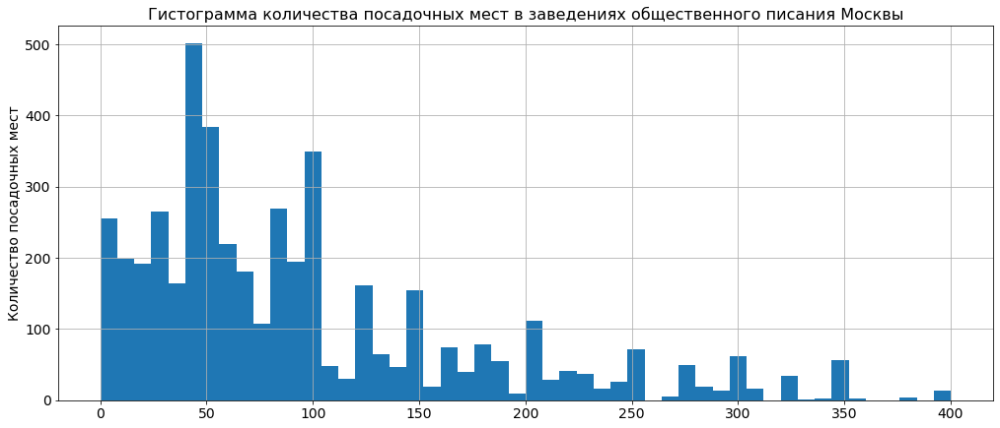

In [21]:
plt.figure(figsize=(17, 7))
df['seats'].hist(bins=50, range=(0, 400))
plt.title('Гистограмма количества посадочных мест в заведениях общественного писания Москвы', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.ylabel('Количество посадочных мест', fontsize=14);

### Вывод по разделу<a id="load3"></a> 
[К содержанию](#intro)

В таблице данные о 8406 заведениях, из которых 5614 уникальных, вероятно остальные заведения сетевые.

Есть пропуски в столбцах hours, priceб avg_bill, middle_avg_bill, middle_coffee_cup и seats.

Полные дубликаты отсутствуют.

Есть 8 категорий заведений(в порядке убывания количества заведений): "кафе", "ресторан", "кофейня", "бар,паб","пиццерия","быстрое питание","столовая" и "булочная".

Существует 1307 разных режимов работы, наиболее популярные (в порядке убывания количества заведений): "ежедневно, 10:00–22:00", "ежедневно, круглосуточно", "ежедневно, 11:00–23:00", "ежедневно, 10:00–23:00", "ежедневно, 12:00–00:00".

Наиболее распространенные рейтинги заведений от 4,1 до 4,5.

Представлены 4 категории цен (в порядке убывания количества заведений): "средние", "выше среднего", "высокие", "низкие".

Есть 5201 несетевое заведение и 3205 сетевое.

Представлены данные по 9 административным округам, больше всего заведений располагается в Центральном, меньше всего в Северо-Западном.

Количество посадочных мест варьируется от 0 до 1288, медианное значение - 75, большая часть заведений вмещает не более 200 человек.

## Предобработка данных<a id="pre"></a> 
[К содержанию](#intro)

### Добавление новых столбцов<a id="pre1"></a>
[К содержанию](#intro)

#### Создание столбца со средней стоимостью бокала пива для категории "бар, паб"<a id="pre11"></a>
[К содержанию](#intro)

In [22]:
len(df[df['avg_bill'].str.contains('Средний счёт|Цена чашки капучино|Цена бокала пива')== False])

0

avg_bill содержит строки начинающиеся только с вышеперечисленных подстрок, можно добавить столбец со средней стоимостью бокала пива

In [23]:
#создаем таблицу где есть средняя стоимость бокала пива
df_bar = df[df['avg_bill'].str.contains('Средний счёт|Цена чашки капучино')== False]
# уберем строку, оставив только цифры 
df_bar['middle_pint'] = df_bar['avg_bill'].str.replace(r"[^\d\–]", "", regex=True)
#создадим столбцы с границами диапазона цены
df_bar[['min_pint', 'max_pint']] = df_bar['middle_pint'].str.extract(r'(\d{2,3})\W+(\d{2,3})')

In [24]:
# в некоторых строках было указано только нижнее значение диапазона, разделим таблицу на две (где указаны обе границы, и где только одна)
df_pivo1 = df_bar[df_bar['min_pint'].isnull()]
df_pivo2 = df_bar[~df_bar['min_pint'].isnull()]
#для таблицы, где указаны две границы диапазона посчитаем среднее
df_pivo2['min_pint'] = df_pivo2 ['min_pint'].astype('int')
df_pivo2['max_pint'] = df_pivo2 ['max_pint'].astype('int')
df_pivo2['middle_pint'] = (df_pivo2['max_pint']+df_pivo2['min_pint'])/2
df_pivo2 = df_pivo2[['name',
                     'address', 
                     'middle_pint',]]
#если указано только одна граница, оставим ее в качестве среднего
df_pivo1 = df_pivo1[['name', 
                     'address',
                     'middle_pint']]
df_pivo1['middle_pint'] = df_pivo1['middle_pint'].astype('int')

In [25]:
#сцепим две таблицы
df_bar = pd.concat([
    df_pivo1,
    df_pivo2
])

In [26]:
#объединим исходную таблицу, с данными о средней стоимости пива
df = df.merge(df_bar, on=['name', 'address'], how='outer')
df = df[['name',
       'category', 
       'address',
       'district',
       'hours',
       'lat',
       'lng',
       'rating',
       'price',
       'avg_bill',
       'middle_avg_bill',
       'middle_coffee_cup',
       'middle_pint',
       'chain',
       'seats']]

#### Создание столбца "street" с названиями улиц из адресов заведений<a id="pre12"></a>
[К содержанию](#intro)

In [27]:
pattern = '\,*,(([а-яА-Я1-9\-ё\s"]+)?(улица|переулок|шоссе|проспект|площадь|проезд|проектируемый проезд|село|Проезд|аллея|бульвар|набережная|тупик|линия|МКАД|парк|заказник|сквер|квартал|сад|Выставка|памятник|просек|Третье транспортное кольцо|ул|мост|жилой комплекс|микрорайон|пр-т|тоннель|музей-заповедник|Сумская)([а-яА-Яё1-9\-\s"]+)?)'
df['street'] = df['address'].str.extract(pat = pattern)[0]
df['street'].isna().sum()

27

не вышло вывести улицы только для 27 заведений

#### Создание столбца "is_24_7", с обозначением, что заведение работает ежедневно и круглосуточно (24/7)<a id="pre13"></a>
[К содержанию](#intro)

In [28]:
def is_24_7(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False
df['is_24_7'] = df['hours'].apply(is_24_7)

### Изменение типов данных<a id="pre2"></a>
[К содержанию](#intro)

#### Приведение столбца "chain" к булевым значениям<a id="pre21"></a>
[К содержанию](#intro)

In [29]:
df['chain'] = df['chain'].astype('bool')

#### Приведение столбца "middle_avg_bill" к числовым значениям<a id="pre22"></a>
[К содержанию](#intro)

In [30]:
df['middle_avg_bill'] = df['middle_avg_bill'].astype('float')

In [31]:
df.info(0)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8406 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  middle_pint        132 non-null    float64
 13  chain              8406 non-null   bool   
 14  seats              4795 non-null   float64
 15  street             8379 non-null   object 
 16  is_24_7            8406 

### Проверка данных на дубликаты<a id="pre3"></a>
[К содержанию](#intro)

In [32]:
df['name'] = df['name'].str.lower()

In [33]:
df.duplicated().sum()

0

In [34]:
df[df.duplicated(subset = ['name','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,NaN,True,188.0,Волоколамское шоссе,False
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,NaN,True,150.0,проспект Мира,False
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,NaN,False,276.0,Ярцевская улица,False


Проверка на полные дубликаты выполнена в первом разделе, но возможно какието заведения попали с таблицу несколько раз, например с разными рейтингами или категориями, чтобы это проверить выполнена проверка на дубликаты по паре "название заведения" + "адрес". Дубликатов не обнаружено, значит каждое заведение действительно попало в таблицу только один раз.

In [35]:
df[df['name']== 'шашлык']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7
54,шашлык,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,"ежедневно, круглосуточно",55.887978,37.515823,3.9,NaN,NaN,NaN,NaN,NaN,True,NaN,Коровинское шоссе,True
91,шашлык,булочная,"Москва, Абрамцевская улица, 1",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.891932,37.573445,4.2,NaN,NaN,NaN,NaN,NaN,True,240.0,Абрамцевская улица,True
6511,шашлык,кафе,"Москва, Большая Косинская улица, 27, стр. 9",Восточный административный округ,NaN,55.717506,37.857975,3.3,NaN,NaN,NaN,NaN,NaN,True,NaN,Большая Косинская улица,False


In [36]:
names = df['name'].tolist()
unique_names = set(names)
unique_names_sorted = sorted(unique_names)
unique_names_sorted

['#кешбэккафе',
 '+39 pizzeria mozzarella bar',
 '1 этаж',
 '1-я креветочная',
 '10 идеальных пицц',
 '1001 ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 chef doner',
 '15 kitchen+bar',
 '15-й шар',
 '16 июня',
 '16 тонн',
 '18 грамм',
 '1901 comfort food zone',
 '1у',
 '2 типа',
 '2-й этаж',
 '2046',
 '21 век',
 '22 акра кофе&хлеб',
 '2u-ту-ю',
 '3 ступени',
 '351 bar',
 '4 сезона',
 '4.2. bar',
 '4/1 restaurant',
 '42 coffee shop',
 '47',
 '495',
 '4friends coffee',
 '4tuna cafe&grill',
 '5 stars coffee',
 '55.709201, 37.392257',
 '6 am bread kitchen',
 '6 рукопожатий',
 '69 раков',
 '7 сэндвичей',
 '7 элемент',
 '7/12',
 '8 oz',
 '8 вафель',
 '8 зёрен',
 '8 пончиков',
 '800°с contemporary steak',
 '8bit pizza',
 '9 bar coffe',
 '9 bar coffee',
 '9 зёрен',
 'a-cafe',
 'abc coffee roasters',
 'acai family',
 'accent',
 "adam's chicken",
 'adria mare',
 'ahava',
 'air coffee',
 'al halal',
 'al33 пиццерия бар боттега',
 'all day',
 'alma',
 'alternative coffee',
 'aly’s poke',
 'amande

In [37]:
df[df['name'].str.contains('surf')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7
1267,surf coffee x flat,кофейня,"Москва, улица Маршала Бирюзова, 18",Северо-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.795065,37.491459,4.5,средние,Цена чашки капучино:149–199 ₽,NaN,174.0,NaN,False,NaN,улица Маршала Бирюзова,False
1322,surf coffee x takeoff,кофейня,"Москва, проезд Аэропорта, 8, стр. 9",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.797857,37.522039,4.7,NaN,Цена чашки капучино:от 139 ₽,NaN,139.0,NaN,False,NaN,проезд Аэропорта,False
1390,surf coffee x highway,кофейня,"Москва, Ленинградский проспект, 66",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.802595,37.526479,4.6,NaN,NaN,NaN,NaN,NaN,False,70.0,Ленинградский проспект,False
1399,surf coffee x otto,кофейня,"Москва, улица Куусинена, 7, корп. 2",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.780140,37.515415,4.7,NaN,NaN,NaN,NaN,NaN,False,10.0,улица Куусинена,False
2291,surf coffee x lovely,кофейня,"Москва, проспект Мира, 40",Центральный административный округ,"пн-пт 08:00–23:00; сб,вс 10:00–23:00",55.780288,37.634008,4.5,средние,Цена чашки капучино:от 169 ₽,NaN,169.0,NaN,False,36.0,проспект Мира,False
5015,surf coffee x studio,кофейня,"Москва, Садовническая улица, 42с1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.744832,37.636873,4.5,NaN,Цена чашки капучино:149–219 ₽,NaN,184.0,NaN,False,NaN,Садовническая улица,False
5060,surf coffee x sababa,кофейня,"Москва, Пятницкий переулок, 3",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.743177,37.630068,4.6,средние,Цена чашки капучино:149–219 ₽,NaN,184.0,NaN,False,4.0,Пятницкий переулок,False
5624,surf coffee x amen,кофейня,"Москва, Аминьевское шоссе, 6",Западный административный округ,"ежедневно, 10:00–22:00",55.706820,37.456788,4.3,NaN,NaN,NaN,NaN,NaN,False,NaN,Аминьевское шоссе,False
5933,surf coffee x lips,кофейня,"Москва, улица Дмитрия Ульянова, 4, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.693511,37.557500,4.5,NaN,Цена чашки капучино:200–300 ₽,NaN,250.0,NaN,False,90.0,улица Дмитрия Ульянова,False
5981,surf coffee x sport,кофейня,"Москва, Усачёва улица, 62",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.724605,37.562321,4.5,NaN,Цена чашки капучино:199–229 ₽,NaN,214.0,NaN,False,NaN,Усачёва улица,False


Явных дубликатов в таблице нет, однако есть часто повтряющиеся названия, причем некоторые из заведений с одинаковыми названиями сетевые, а некоторые нет, так же есть похожие названия которые возможно принадлежат к одной сети (например сеть surf coffee представлена в датафрейме как несетевые кофейни с разными названиями). Поэтому качественно очистить данные от неявных дубликатов невозможно. Если бы в данных присутвовали уникальные идентификаторы сетей и заведений, можно было бы воспользоваться ими, например можно добавить столбец с ИНН организации, тогда можно было бы группировать данные по нему, наиболее точно выбрать сетевые и несетевые заведения и качественно избавиться от неявных дубликатов в названиях.

### Проверка данных на пропуски<a id="pre4"></a>
[К содержанию](#intro)

In [38]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
middle_pint          8274
chain                   0
seats                3611
street                 27
is_24_7                 0
dtype: int64

Есть 536 пропусков в часах работы, их не получится заполнить.

5091 пропуск в категории цен, если для этих строк есть значения диапозона среднего чека (avg_bill), их можно будет заполнить, задав категории цен для каждой категории заведения.

4590 пропусков в значениях диапозона среднего чека можно заполнить, если для этих строк есть категория цен.

5257 пропусков в middle_avg_bill можно заполнить если значение диапозона среднего чека начинается с подстроки "Средний счёт:"

7871 пропуск в middle_coffee_cup можно заполнить если значение диапозона среднего чека начинается с подстроки "Цена чашки капучино"

8274 пропуска в middle_pint можно заполнить если значение диапозона среднего чека начинается с подстроки "Цена бокала пива"

3611 пропусков в количестве посадочных мест заполнить не получится, однако стоит проверить, для каких категорий заведений отсутствуют эти данные.

27 пропусков в street не получится заполнить.

### Заполнение и удаление пропусков<a id="pre5"></a>
[К содержанию](#intro)

#### Посмотрим какие катеории заведений соответствуют среднему чеку, средней стоимости чашки кофе и средней стоимости бокала пива.<a id="pre51"></a>
[К содержанию](#intro)

In [39]:
df[~df['middle_avg_bill'].isna()]['category'].unique()

array(['ресторан', 'кафе', 'пиццерия', 'бар,паб', 'быстрое питание',
       'столовая', 'кофейня', 'булочная'], dtype=object)

Средний чек может присутствовать во всех категориях.

In [40]:
df[~df['middle_coffee_cup'].isna()]['category'].unique()

array(['кофейня', 'кафе', 'пиццерия', 'бар,паб', 'быстрое питание'],
      dtype=object)

Средняя чена чашки кофе будет присутствовать в категориях 'кофейня', 'кафе', 'пиццерия', 'бар,паб', 'быстрое питание'.

In [41]:
df[~df['middle_pint'].isna()]['category'].unique()

array(['бар,паб', 'пиццерия'], dtype=object)

Средняя цена бокала пива есть только в категориях  'бар,паб' и 'пиццерия'.

#### Проверим, есть ли строки, для которых посчитано больше одной из средних<a id="pre52"></a>
[К содержанию](#intro)

In [42]:
df[(
    ~df['middle_avg_bill'].isna() & ~df['middle_coffee_cup'].isna()
) | (
    ~df['middle_avg_bill'].isna() & ~df['middle_pint'].isna()
)| (
    ~df['middle_coffee_cup'].isna() & ~df['middle_pint'].isna()
) | (
    ~df['middle_coffee_cup'].isna() & ~df['middle_pint'].isna() & ~df['middle_avg_bill'].isna())]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7


Для каждой строки есть только что-то одно, либо средний чек, либо средняя цена чашки кофе, либо средняя цена бокала пива.

#### Проверим, есть ли строки, в которых есть значение avg_bill но нет значений в middle_avg_bill, middle_avg_bill и middle_pint<a id="pre53"></a>
[К содержанию](#intro)

In [43]:
df[~df['avg_bill'].isna() & (df['middle_avg_bill'].isna() & df['middle_coffee_cup'].isna() & df['middle_pint'].isna())]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7


Нет таких строк где есть диапазон цен, но нет среднего чека, цены чашки кофе или цены бокала пива.

Заполним пропуски в middle_avg_bill, middle_coffee_cup и middle_pint нулями и выведем колонку 'avg' в которой будет отображаться средий счет для каждого заведения.	

In [44]:
df[['middle_avg_bill', 'middle_coffee_cup', 'middle_pint']] = df[['middle_avg_bill', 'middle_coffee_cup', 'middle_pint']].fillna(0)

#### Заполним пропуски в категориях цен.<a id="pre54"></a>
[К содержанию](#intro)

In [45]:
df['avg'] = df['middle_avg_bill'] + df['middle_coffee_cup'] + df['middle_pint']
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,0.0,0.0,0.0,False,NaN,улица Дыбенко,False,0.0
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,0.0,0.0,False,4.0,улица Дыбенко,False,1550.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,0.0,0.0,False,45.0,Клязьминская улица,False,1000.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,0.0,170.0,0.0,False,NaN,улица Маршала Федоренко,False,170.0
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,0.0,0.0,True,148.0,Правобережная улица,False,500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,0.0,0.0,0.0,False,86.0,Профсоюзная улица,False,0.0
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,0.0,0.0,0.0,False,150.0,Пролетарский проспект,False,0.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,0.0,0.0,False,150.0,Люблинская улица,True,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,0.0,0.0,0.0,True,150.0,Люблинская улица,True,0.0


In [46]:
df[df['price'].isna() & df['avg'] != 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,0.0,170.0,0.0,False,NaN,улица Маршала Федоренко,False,170.0
27,шаурму х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.879324,37.480280,4.1,NaN,Средний счёт:от 240 ₽,240.0,0.0,0.0,False,4.0,улица Дыбенко,False,240.0
32,додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,0.0,0.0,True,46.0,Коровинское шоссе,False,328.0
34,домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,0.0,0.0,True,247.0,Клязьминская улица,False,500.0
49,2u-ту-ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,0.0,0.0,False,NaN,Ижорская улица,True,900.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8366,ситипицца,пиццерия,"Москва, Ферганская улица, 12",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.708143,37.808957,4.2,NaN,Средний счёт:300–700 ₽,500.0,0.0,0.0,False,4.0,Ферганская улица,False,500.0
8383,pizza24/7,пиццерия,"Москва, улица Юных Ленинцев, 10/15к1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.698824,37.738878,4.2,NaN,Средний счёт:150 ₽,150.0,0.0,0.0,False,NaN,улица Юных Ленинцев,True,150.0
8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,0.0,100.0,0.0,False,NaN,Новохохловская улица,False,100.0
8399,"пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,0.0,0.0,False,50.0,Болотниковская улица,True,150.0


Есть 743 строки, где есть диапазон цен, но нет категории для них.

In [47]:
df.pivot_table(index=['category','price'], values='avg', aggfunc=['max', 'median'])

max  median
                                   avg     avg
category        price                         
бар,паб         высокие        11000.0  1750.0
                выше среднего   4500.0  1250.0
                низкие           190.0   170.0
                средние         1250.0   575.0
булочная        высокие         2500.0  2250.0
                выше среднего   1250.0  1225.0
                низкие           200.0   150.0
                средние         1000.0   442.5
быстрое питание высокие         5500.0  3200.0
                выше среднего   1500.0  1250.0
                низкие           225.0   150.0
                средние         1100.0   400.0
кафе            высокие         4500.0  2000.0
                выше среднего   1700.0  1250.0
                низкие           600.0   150.0
                средние         1750.0   450.0
кофейня         высокие         2500.0  2000.0
                выше среднего   2000.0  1250.0
                низкие           325.0   139.0
                средние         1568.0   250.0
пиццерия        высокие         3000.0  1825.0
                выше среднего   2000.0  1250.0
                низкие           300.0    75.0
                средние         1250.0   550.0
ресторан        высокие        35000.0  2250.0
                выше среднего   2250.0  1250.0
                низкие           575.0   300.0
                средние         2150.0   650.0
столовая        высокие         3750.0  3750.0
                выше среднего   1250.0  1225.0
                низкие           265.0   212.5
                средние         1000.0   300.0

Каким образом заполнялись категории непонятно, например для категории кафе максимальная цена в категории средние - 1750, а в категории выше среднего - 1700. Лучше будет перезаполнить категории самостоятельно.

In [48]:
def price(row):
        if row['category'] == 'бар,паб':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 400:
                return 'низкие'
            elif row['avg'] > 400 and row['avg'] <= 1000:
                return 'средние'
            elif row['avg'] > 1000 and row['avg'] <= 1500:
                return 'выше среднего'
            elif row['avg'] > 1500 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'булочная':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 300:
                return 'низкие'
            elif row['avg'] > 300 and row['avg'] <= 800:
                return 'средние'
            elif row['avg'] > 800 and row['avg'] <= 1500:
                return 'выше среднего'
            elif row['avg'] > 1500 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'быстрое питание':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 300:
                return 'низкие'
            elif row['avg'] > 300 and row['avg'] <= 1000:
                return 'средние'
            elif row['avg'] > 1000 and row['avg'] <= 1500:
                return 'выше среднего'
            elif row['avg'] > 1500 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'кафе':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 300:
                return 'низкие'
            elif row['avg'] > 300 and row['avg'] <= 800:
                return 'средние'
            elif row['avg'] > 800 and row['avg'] <= 1500:
                return 'выше среднего'
            elif row['avg'] > 1500 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'кофейня':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 200:
                return 'низкие'
            elif row['avg'] > 200 and row['avg'] <= 800:
                return 'средние'
            elif row['avg'] > 800 and row['avg'] <= 1500:
                return 'выше среднего'
            elif row['avg'] > 1500 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'пиццерия':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 400:
                return 'низкие'
            elif row['avg'] > 400 and row['avg'] <= 1000:
                return 'средние'
            elif row['avg'] > 1000 and row['avg'] <= 2000:
                return 'выше среднего'
            elif row['avg'] > 2000 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'ресторан':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 500:
                return 'низкие'
            elif row['avg'] > 500 and row['avg'] <= 1000:
                return 'средние'
            elif row['avg'] > 1000 and row['avg'] <= 2000:
                return 'выше среднего'
            elif row['avg'] > 2000 :
                return 'высокие'
            else:
                return ''
        if row['category'] == 'столовая':
            if row['avg'] == 0:
                return 'неизвестно'
            if row['avg'] <= 250:
                return 'низкие'
            elif row['avg'] > 250 and row['avg'] <= 1000:
                return 'средние'
            elif row['avg'] > 1000 and row['avg'] <= 3000:
                return 'выше среднего'
            elif row['avg'] > 3000 :
                return 'высокие'
            else:
                return ''

In [49]:
df['price'] = df.apply(price, axis=1)
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,NaN,0.0,0.0,0.0,False,NaN,улица Дыбенко,False,0.0
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,0.0,0.0,False,4.0,улица Дыбенко,False,1550.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,выше среднего,Средний счёт:от 1000 ₽,1000.0,0.0,0.0,False,45.0,Клязьминская улица,False,1000.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,0.0,170.0,0.0,False,NaN,улица Маршала Федоренко,False,170.0
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,0.0,0.0,True,148.0,Правобережная улица,False,500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,неизвестно,NaN,0.0,0.0,0.0,False,86.0,Профсоюзная улица,False,0.0
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,неизвестно,NaN,0.0,0.0,0.0,False,150.0,Пролетарский проспект,False,0.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,низкие,Средний счёт:от 150 ₽,150.0,0.0,0.0,False,150.0,Люблинская улица,True,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,неизвестно,NaN,0.0,0.0,0.0,True,150.0,Люблинская улица,True,0.0


In [50]:
df[df['avg']<1 & ~df['avg_bill'].isna()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,неизвестно,Средний счёт:от 0 ₽,0.0,0.0,0.0,True,200.0,улица Новый Арбат,True,0.0


 ### Вывод по разделу<a id="pre6"></a>
 [К содержанию](#intro)

Было создано 4 новых столбца: "midle_pint" со средней стоимостью бокала пива, "street" с названием улицы, где находится заведение, "is_24_7" со значениями true-заведение является круглосуточным, false-заведение не является круглосуточным, и "avg" - единый столбец со средним чеком заведения (содержит средний чек, стоимость чашки кофе или стоимость бокала пива, в зависимости от того какие данные были в исходном файле).

Данные были приведены к оптимальным типам переменных

Данные были проверены на явные дубликаты и на дубликаты по паре значений название+адрес. Явных дубликатов в таблице нет, однако есть часто повтряющиеся названия, причем некоторые из заведений с одинаковыми названиями сетевые, а некоторые нет, так же есть похожие названия которые возможно принадлежат к одной сети (например сеть surf coffee представлена в датафрейме как несетевые кофейни с разными названиями). Поэтому качественно очистить данные от неявных дубликатов невозможно. Если бы в данных присутвовали уникальные идентификаторы сетей и заведений, можно было бы воспользоваться ими, например можно добавить столбец с ИНН организации, тогда можно было бы группировать данные по нему, наиболее точно выбрать сетевые и несетевые заведения и качественно избавиться от неявных дубликатов в названиях.

Есть 536 пропусков в часах работы, их не получится заполнить.

5091 пропуск в категории цен, если для этих строк есть значения диапозона среднего чека (avg_bill), их можно будет заполнить, задав категории цен для каждой категории заведения.

4590 пропусков в значениях диапозона среднего чека можно заполнить, если для этих строк есть категория цен.

5257 пропусков в middle_avg_bill можно заполнить если значение диапозона среднего чека начинается с подстроки "Средний счёт:"

7871 пропуск в middle_coffee_cup можно заполнить если значение диапозона среднего чека начинается с подстроки "Цена чашки капучино"

8274 пропуска в middle_pint можно заполнить если значение диапозона среднего чека начинается с подстроки "Цена бокала пива"

3611 пропусков в количестве посадочных мест заполнить не получится, однако стоит проверить, для каких категорий заведений отсутствуют эти данные.

27 пропусков в street не получится заполнить.

Были выбраны границы ценовых диапазонов для каждой категории и перезаполнены категории цен.

## Анализ данных<a id="analysis"></a>
[К содержанию](#intro)

### Изучение данных в разрезе категорий<a id="analysis1"></a>
[К содержанию](#intro)

Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [51]:
df.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


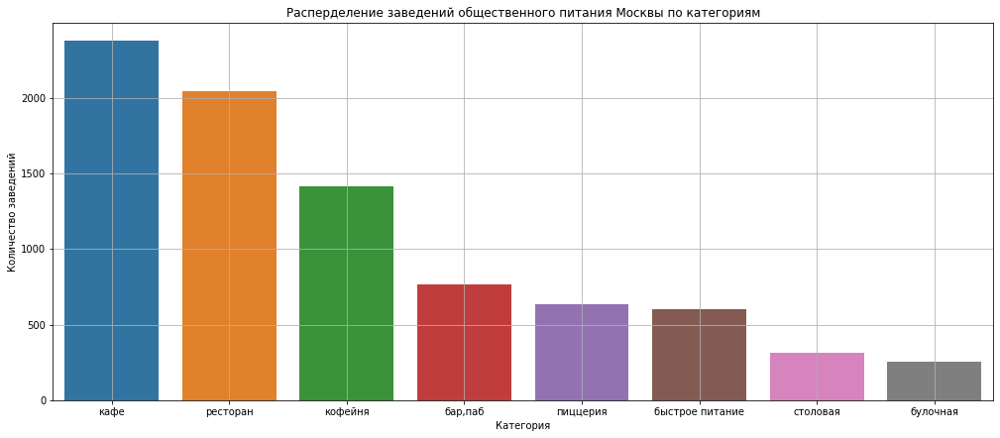

In [52]:
plt.figure(figsize=(17,7))
sns.barplot(x='category', 
            y='name', 
            data=df.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False))
plt.title('Расперделение заведений общественного питания Москвы по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

В таблице представлены 8 категорий заведений : "кафе", "ресторан", "кофейня", "бар,паб","пиццерия","быстрое питание","столовая" и "булочная". Кафе и рестораны составляют больше половины всех заведений Москвы. Четверть занимают кофейни и бары, и еще четверть приходитсяна пиццерии, заведения быстрого питания, столовые и булочные. 

### Изучение данных в разрезе количества посадочных мест<a id="analysis2"></a>
[К содержанию](#intro)

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

#### Сколько всего человек могут одновременно вместить заведения Москвы?<a id="analysis21"></a>
[К содержанию](#intro)

In [53]:
df.groupby('category')['seats'].sum()

category
бар,паб             58281.0
булочная            13229.0
быстрое питание     34513.0
кафе               118770.0
кофейня             83511.0
пиццерия            40350.0
ресторан           154869.0
столовая            16359.0
Name: seats, dtype: float64

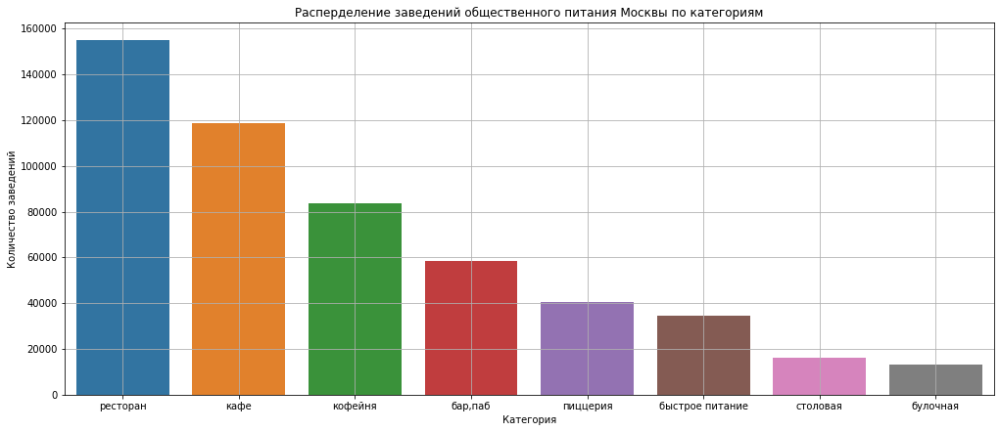

In [54]:
plt.figure(figsize=(17,7))
sns.barplot(x='category', y='seats', data=df.groupby('category')['seats'].sum().reset_index().sort_values(by='seats', ascending=False))
plt.title('Расперделение заведений общественного питания Москвы по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

In [55]:
df.groupby('category')['seats'].sum().sum()

519882.0

Заведения Москвы с указанным количеством мест (около трети этих данных пропущено) могут одновременно вместить более полумиллиона человек, это около 4% от населения Москвы на 2022 год. При этом больше половины посадочных мест находятся в кафе и ресторанах. Выпить в барах и пабах Москвы могут одновременно 58 тысяч человек, а поужинать в ресторанах почти 155 тысяч.

#### Посмотрим на распределение заведений по количеству посадочных мест<a id="analysis22"></a>
[К содержанию](#intro)

In [56]:
x_values = pd.Series(range(0, len(df)))
fig = px.scatter(df,
                 x=x_values,
                 y='seats', opacity=0.5)

fig.update_layout(title='Точечная диаграмма распределения количества посадочных мест в заведениях',
                   xaxis_title='',
                   yaxis_title='Количество посадочных мест')

fig.show()

Выше отметки в 400 мест видны единичные случаи, будем считать их выбросами и построим гистограмму с ограничением посадочных мест до 400.

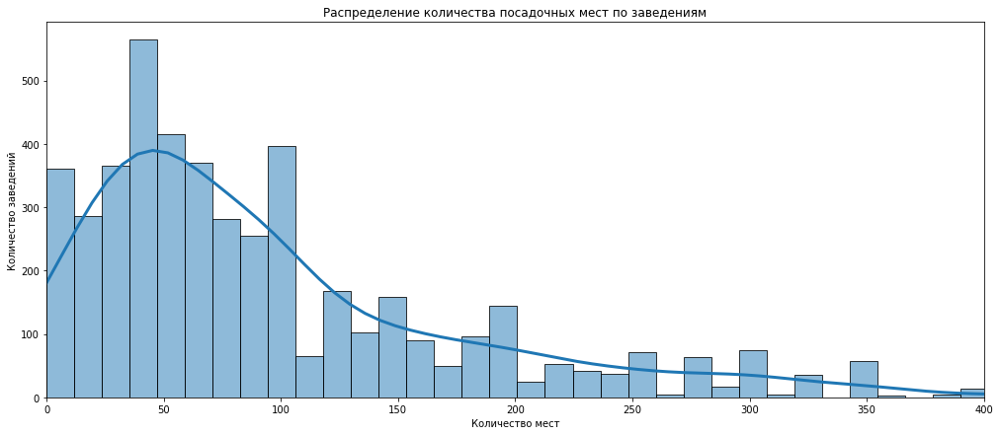

In [57]:
plt.figure(figsize=(17,7))
sns.histplot(x='seats', data=df, kde=True, line_kws={'lw': 3})
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества посадочных мест по заведениям')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.xlim(0,400)
# отображаем график на экране
plt.show()

Пик количества посадочных мест приходится на 40-60.

#### Медианное количество мест по категориям.<a id="analysis23"></a>
[К содержанию](#intro)

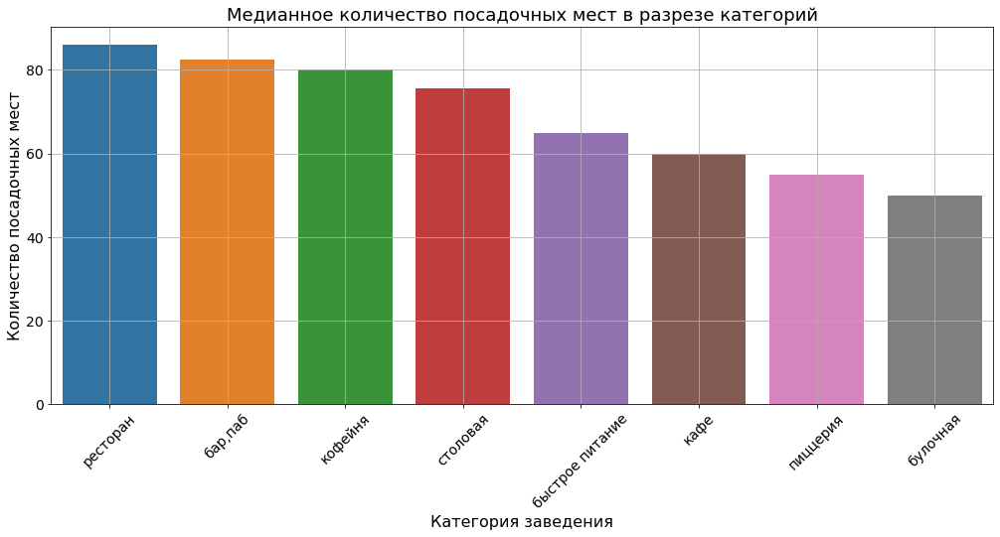

In [58]:
plt.figure(figsize=(17, 7))
sns.barplot(data=df.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False), x='category', y='seats')
plt.title('Медианное количество посадочных мест в разрезе категорий', fontsize=18)
plt.ylabel('Количество посадочных мест', fontsize=16)
plt.xlabel('Категория заведения', fontsize=16)
plt.grid()
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14);

Самыми вместительными оказались рестораны, бары и кофейни (окло 80 мест в заведении), меньше всего людей вмещают булочные и пиццерии (около 50)

#### Есть ли разница в количестве посадочных мест для сетевых и несетевых заведений?<a id="analysis24"></a>
[К содержанию](#intro)

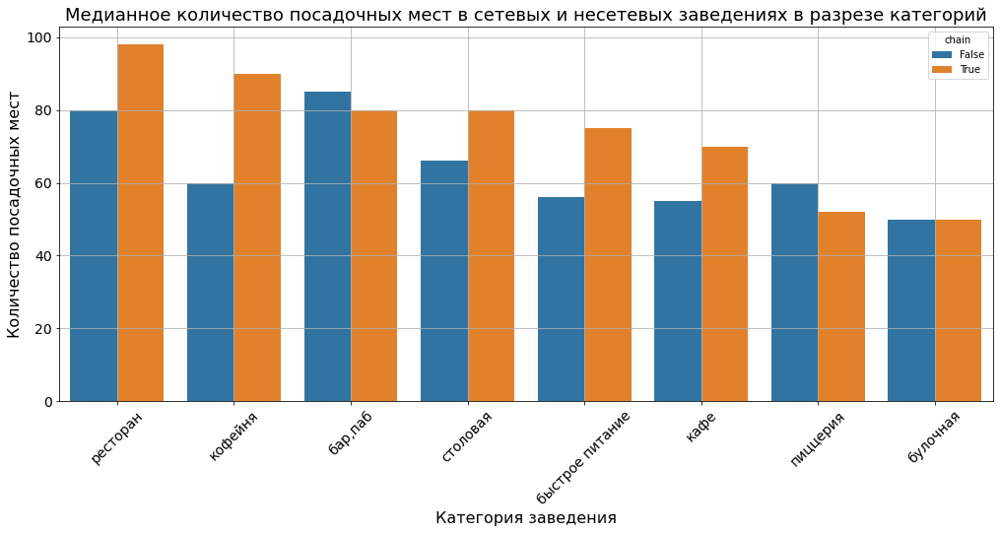

In [59]:
plt.figure(figsize=(17, 7))
sns.barplot(data=df.groupby(['category', 'chain'])['seats'].median().reset_index().sort_values(by='seats', ascending=False),x='category',y='seats', hue='chain')
plt.title('Медианное количество посадочных мест в сетевых и несетевых заведениях в разрезе категорий', fontsize=18)
plt.ylabel('Количество посадочных мест', fontsize=16)
plt.xlabel('Категория заведения', fontsize=16)
plt.grid()
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14);

В несетевых барах и пиццериях медианное количество мест немного больше, а в остальных 6 категориях сетевые заведения более вместительны, особенно это касается кофеен и заведений быстрого питания.

#### Есть ли разница в количестве посадочных мест для круглосуточных и некруглосуточных заведений?<a id="analysis25"></a>
[К содержанию](#intro)

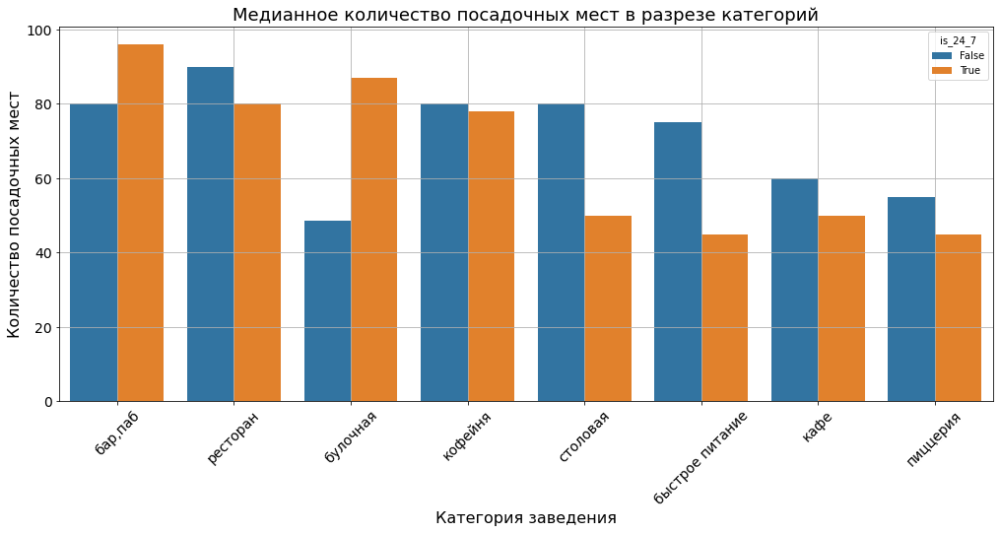

In [60]:
plt.figure(figsize=(17, 7))
sns.barplot(data=df.groupby(['category', 'is_24_7'])['seats'].median().reset_index().sort_values(by='seats', ascending=False),x='category',y='seats', hue='is_24_7')
plt.title('Медианное количество посадочных мест в разрезе категорий', fontsize=18)
plt.ylabel('Количество посадочных мест', fontsize=16)
plt.xlabel('Категория заведения', fontsize=16)
plt.grid()
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14);

В круглосуточных барах и булочных медианное количество мест немного больше, в кофейнях разницы почти нет, а в остальных 5категориях некруглосуточные заведения более вместительны, особенно это касается столовых и заведений быстрого питания.

### Изучение данных в разрезе сетевых и несетевых заведений<a id="analysis3"></a>
[К содержанию](#intro)

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [61]:
# строим столбчатую диаграмму 
fig = px.bar(df.groupby('chain')['name'].count().reset_index(),
             x='name',
             y='chain',
             text='name')
# оформляем график
fig.update_layout(title='Соотношение количества сетевых и несетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения (сетевое/несетевое)')
fig.show() # выводим график

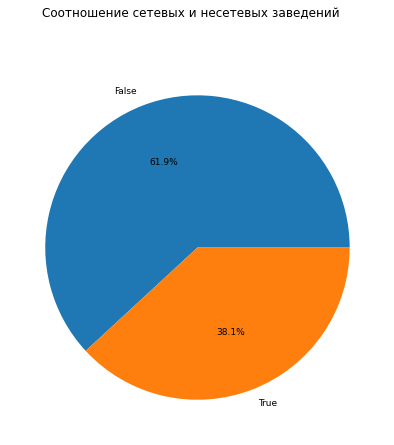

In [62]:
df.groupby('chain')['name'].count().plot(kind='pie',
    subplots=True,  
    autopct ='%1.1f%%', 
    legend=False, 
    figsize=(7,7), 
    fontsize=9, 
    ylabel='', 
    title='Соотношение сетевых и несетевых заведений');

Несетевых заведений на 2000 больше чем несетевых. В процентном соотношении cетевые заведения составляют 38.1% а несетевые 61.9%.

#### Какие категории заведений чаще являются сетевыми?<a id="analysis31"></a>
[К содержанию](#intro)

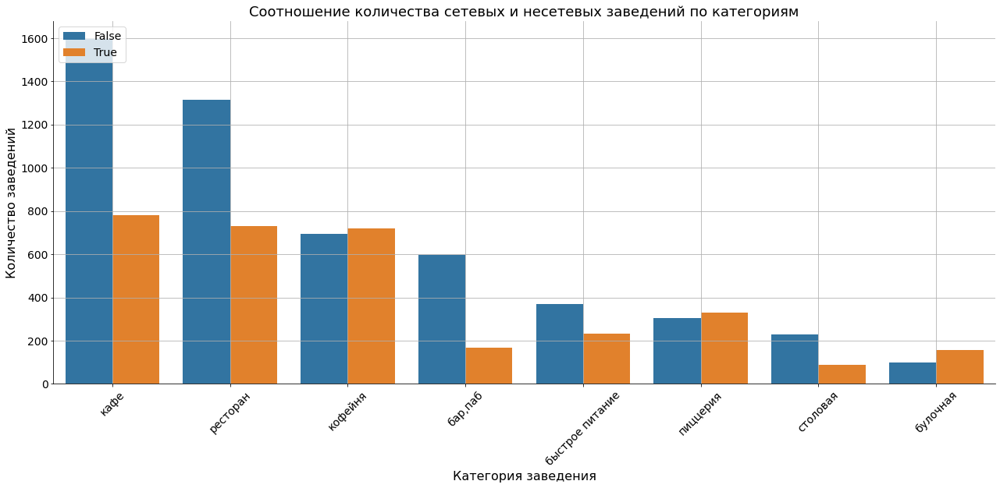

In [63]:
sns.catplot(y="name", 
            x="category",
            hue="chain",
            data=df.groupby(['category', 'chain'])['name'].count().reset_index().sort_values(by='name', ascending=False),
            kind="bar",
            height=7, aspect=2.5, legend=False)
plt.title('Соотношение количества сетевых и несетевых заведений по категориям', fontsize=18)
plt.ylabel('Количество заведений', fontsize=16)
plt.xlabel('Категория заведения', fontsize=16)
plt.grid()
plt.legend(fontsize=14, loc='upper left')
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14);

Сетевые булочные, кофейни и пиццерии встречаются немного чаше чем несетевые. Несетевых кафе, ресторанов и баров гораздо больше чем стевых

### Топ-15 популярных сетей в Москве<a id="analysis4"></a>
[К содержанию](#intro)

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [64]:
top_15_chain = df[
    df['chain']==True
].groupby(
    ['name','category']
).agg({'address':'count', 
       'seats':'median', 
       'rating':'median', 
       'price':'first'}).reset_index().sort_values(
    by='address', 
    ascending=False).head(15)
top_15_chain

,name,category,address,seats,rating,price
1126,шоколадница,кофейня,119,96.0,4.2,средние
496,домино'с пицца,пиццерия,76,40.0,4.2,средние
489,додо пицца,пиццерия,74,52.0,4.3,низкие
205,one price coffee,кофейня,71,99.5,4.2,неизвестно
1142,яндекс лавка,ресторан,69,46.0,4.0,неизвестно
72,cofix,кофейня,65,87.5,4.1,неизвестно
241,prime,ресторан,49,97.0,4.2,низкие
617,кофепорт,кофейня,42,85.0,4.2,низкие
632,кулинарная лавка братьев караваевых,кафе,39,70.0,4.4,средние
963,теремок,ресторан,36,87.5,4.1,низкие


Заполним неизвестные категории цен

In [65]:
df[df['name']=='one price coffee']['price'].value_counts()

неизвестно    66
низкие         6
Name: price, dtype: int64

In [66]:
df[df['name']=='яндекс лавка']['price'].value_counts()

неизвестно    69
Name: price, dtype: int64

In [67]:
df[df['name']=='cofix']['price'].value_counts()

низкие        35
неизвестно    30
Name: price, dtype: int64

In [68]:
df[df['name']=='cofefest']['price'].value_counts()

неизвестно    25
низкие         5
средние        2
Name: price, dtype: int64

In [69]:
df[df['name']=='буханка']['price'].value_counts()

неизвестно    28
низкие         4
Name: price, dtype: int64

In [70]:
df[df['name']=='drive café']['price'].value_counts()

неизвестно    24
Name: price, dtype: int64

In [71]:
top_15_chain.loc[205,'price'] = 'низкие'
top_15_chain.loc[72,'price'] = 'низкие'
top_15_chain.loc[50,'price'] = 'низкие'
top_15_chain.loc[384,'price'] = 'низкие'
top_15_chain.loc[632,'name'] = 'братья караваевы'
top_15_chain

,name,category,address,seats,rating,price
1126,шоколадница,кофейня,119,96.0,4.2,средние
496,домино'с пицца,пиццерия,76,40.0,4.2,средние
489,додо пицца,пиццерия,74,52.0,4.3,низкие
205,one price coffee,кофейня,71,99.5,4.2,низкие
1142,яндекс лавка,ресторан,69,46.0,4.0,неизвестно
72,cofix,кофейня,65,87.5,4.1,низкие
241,prime,ресторан,49,97.0,4.2,низкие
617,кофепорт,кофейня,42,85.0,4.2,низкие
632,братья караваевы,кафе,39,70.0,4.4,средние
963,теремок,ресторан,36,87.5,4.1,низкие


In [72]:
top_15_chain['category'].value_counts()

кофейня     6
кафе        3
ресторан    3
пиццерия    2
булочная    1
Name: category, dtype: int64

In [73]:
fig = px.pie(top_15_chain.groupby('category')['name'].count().reset_index(), 
             values='name', 
             names='category', 
             title='Распределение категорий среди топ-15 сетей')
fig.show()

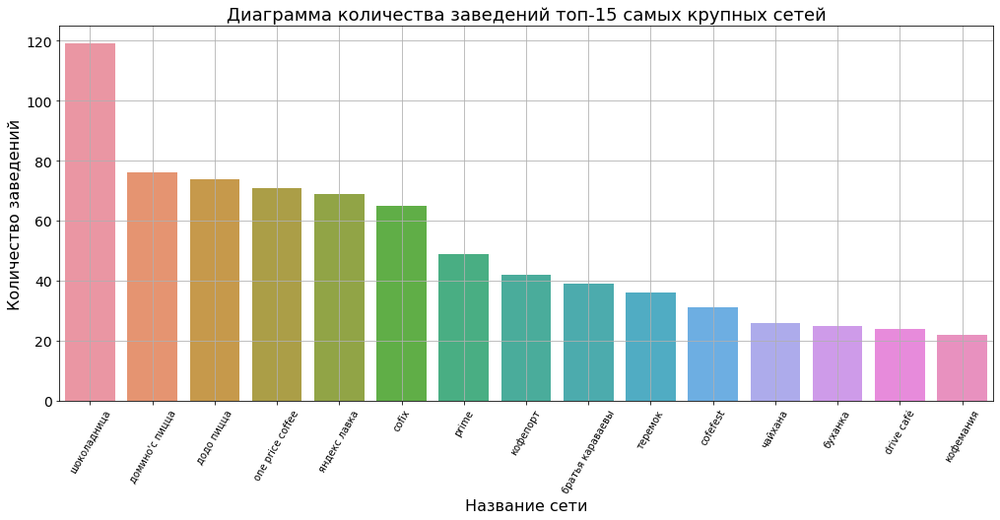

In [74]:
plt.figure(figsize=(17, 7))
sns.barplot(x='name', y='address', data=top_15_chain)
plt.title('Диаграмма количества заведений топ-15 самых крупных сетей', fontsize=18)
plt.ylabel('Количество заведений', fontsize=16)
plt.xlabel('Название сети', fontsize=16)
plt.grid()
plt.xticks(rotation=60)
plt.yticks(fontsize=14);

Более трети самых популярных сетевых заведений занимают кофейни. Самая популярная сеть кофеен "Шоколадница" насчитывает 119 заведений в Москве, далее две пицерии Доминос(76) и До-до(74).

In [75]:
fig = px.pie(top_15_chain.groupby('category')['address'].sum().reset_index(), 
             values='address', 
             names='category', 
             title='Распределение заведений топ-15 популярных сетей по категориям')
fig.show()

Если считать заведения, а не категории, то кофейни составляют уже 45,6%, рестораны 20,1%, а пиццерии 19,5%.

#### Рассмотрим медианное количество посадочных мест в заведениях топ-15 сетей.<a id="analysis41"></a>
[К содержанию](#intro)

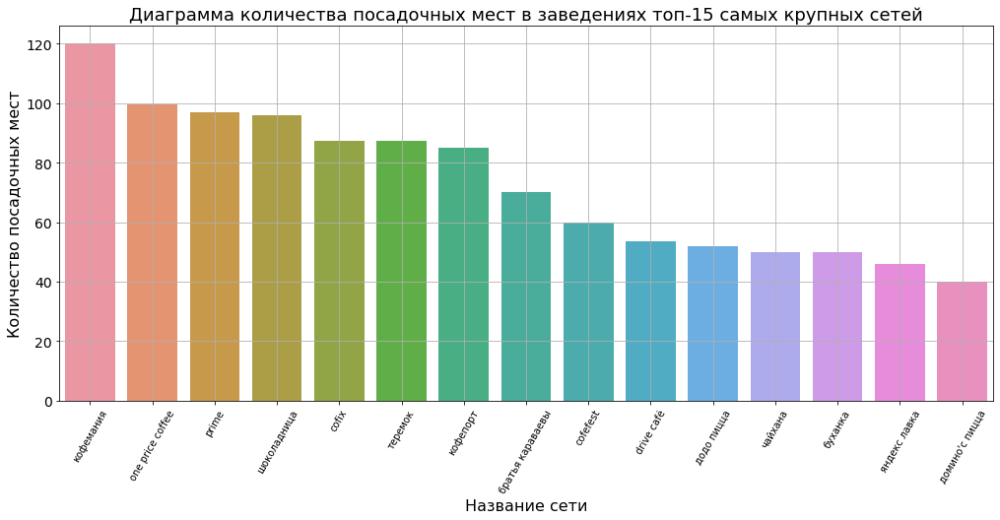

In [76]:
plt.figure(figsize=(17, 7))
sns.barplot(x='name', y='seats', data=top_15_chain.sort_values(by='seats', ascending=False))
plt.title('Диаграмма количества посадочных мест в заведениях топ-15 самых крупных сетей', fontsize=18)
plt.ylabel('Количество посадочных мест', fontsize=16)
plt.xlabel('Название сети', fontsize=16)
plt.grid()
plt.xticks(rotation=60)
plt.yticks(fontsize=14);

В среднем в заведениях топ-15 сетей около 60 мест, меньше всего в До-до (40), больше всего в Кофемании(120

#### Расмотрим  медианные рейтинги<a id="analysis42"></a>
[К содержанию](#intro)

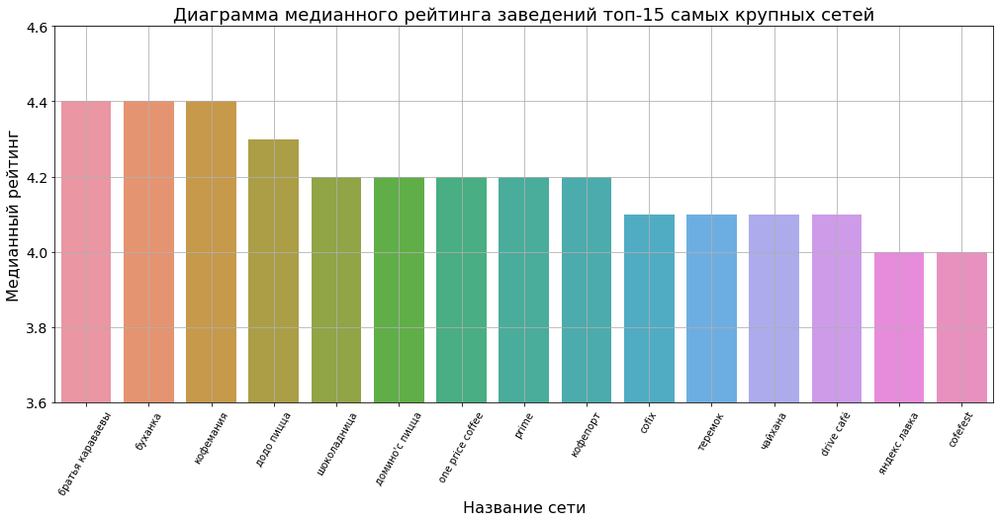

In [77]:
plt.figure(figsize=(17, 7))
sns.barplot(x='name', y='rating', data=top_15_chain.sort_values(by='rating', ascending=False))
plt.title('Диаграмма медианного рейтинга заведений топ-15 самых крупных сетей', fontsize=18)
plt.ylabel('Медианный рейтинг', fontsize=16)
plt.xlabel('Название сети', fontsize=16)
plt.grid()
plt.ylim(3.6,4.6)
plt.xticks(rotation=60)
plt.yticks(fontsize=14);

Медианные рейтинги от 4,0 до 4,4. Ниже всего у Яндекс лавки и Сofefest, самые высокие у Братьев Караваевых, Буханки и Кофемании.

#### Расмотрим  ценовые категории<a id="analysis43"></a>
[К содержанию](#intro)

In [78]:
top_15_chain['price'].value_counts()

низкие           8
средние          4
неизвестно       2
выше среднего    1
Name: price, dtype: int64

In [79]:
fig = px.pie(top_15_chain.groupby('price')['address'].sum().reset_index(), 
             values='address', 
             names='price', 
             title='Распределение заведений топ-15 популярных сетей по категориям цен')
fig.show()

Если ценовая категория известна, в 51% случаев она относится к низким, в 34 к средним, и в 3% к категории выше среднего

### Изучение данных в разрезе административныз районов<a id="analysis5"></a>
[К содержанию](#intro)

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [80]:
df_distr = df.groupby(['district', 'category'])['name'].count().reset_index().sort_values(['district', 'name'])
fig = px.bar(df_distr, x='district', y='name', color='category', text='category', title='Расперделение заведений по округам')
fig.update_layout(width=1000, # указываем размеры графика
                  height=1000)
fig.update_xaxes(title_text='Округ') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений')
fig.show()

В таблице представлено 9 административных районов Москвы:Центральный, Северный, Южный, Северо-Восточный, Западный, Восточный, Юго-Восточный, Юго-Западный, Северо-Западный.

В центральном округе заведений больше всего, меньше всего в Северо-Западном.

Во всех округах кроме Центрального самая обширная категория заведений - кафе, в Центральном самая популярная категория - ресторан, далее кафе, кофейни и бары. Кофейни обычно третья по численности группа (исключение - Северный АО, там кофейни на втором месте). Самые редкие заведения во всех районах - столовые и булочные.

In [81]:
mos_stat = pd.DataFrame({
    'district': [
        'Центральный административный округ', 
        'Северный административный округ', 
        'Южный административный округ', 
        'Западный административный округ', 
        'Восточный административный округ', 
        'Северо-Восточный административный округ', 
        'Северо-Западный административный округ', 
        'Юго-Восточный административный округ', 
        'Юго-Западный административный округ'], 
    'population': [
        779352, 
        1186128, 
        1791187, 
        1395986, 
        1524265, 
        1432571, 
        1011387, 
        1431746, 
        1446432]})

# данные за 2021 год (не нашла такое на 2022) взяты с сайта https://www.statdata.ru/naselenie-moskvy-po-okrugam-i-rajonam

mos_stat = mos_stat.merge(df.groupby('district').agg({'name':'count', 'seats':'sum'}), on='district')
mos_stat['place_for_1000'] = round((mos_stat['name']/mos_stat['population'])*1000, 2)
mos_stat['seats_for_1000'] = round((mos_stat['seats']/mos_stat['population'])*1000, 2)
mos_stat

,district,population,name,seats,place_for_1000,seats_for_1000
0,Центральный административный округ,779352,2242,143765.0,2.88,184.47
1,Северный административный округ,1186128,900,62415.0,0.76,52.62
2,Южный административный округ,1791187,892,62323.0,0.50,34.79
3,Западный административный округ,1395986,851,74237.0,0.61,53.18
4,Восточный административный округ,1524265,798,34784.0,0.52,22.82
5,Северо-Восточный административный округ,1432571,891,49900.0,0.62,34.83
6,Северо-Западный административный округ,1011387,409,25518.0,0.40,25.23
7,Юго-Восточный административный округ,1431746,714,28732.0,0.50,20.07
8,Юго-Западный административный округ,1446432,709,38208.0,0.49,26.42


''

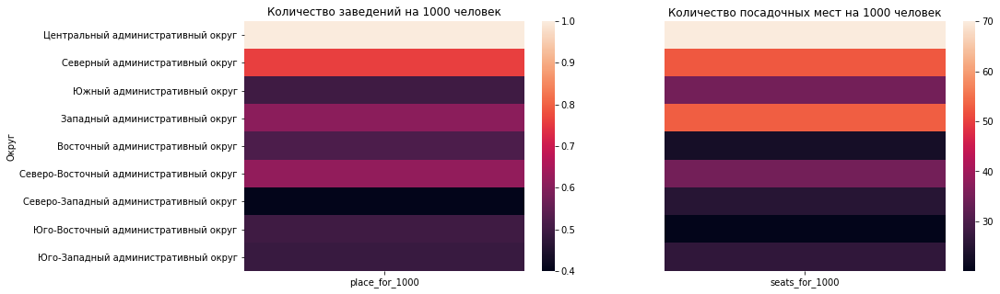

In [82]:
plt.figure(figsize=(15, 5))
ax1 = plt.subplot(1, 2, 1)
sns.heatmap(
    mos_stat.set_index('district')[['place_for_1000']], ax=ax1, vmax=1).set(
    title='Количество заведений на 1000 человек', 
    xlabel='', 
    ylabel='Округ')

ax2 = plt.subplot(1, 2, 2)
sns.heatmap(
    mos_stat.set_index('district')[['seats_for_1000']], ax=ax2, vmax=70).set(
    title='Количество посадочных мест на 1000 человек', 
    xlabel='', 
    ylabel='')
plt.yticks([])
;

В центральном округе на 1000 человек приходится 2,88 заведений и 184.47 посадочных мест, наблюдается высокая концентрация заведений при низкой численности населения. Большое количество заведений объясняется тем, что центральный округ является местом досуга для многих москвичей. Далее идут Северный, Северо-Восточный и Западный АО, там на 1000 человек приходися от 0,61 до 0,76 заведений и от 34 до 53 посадочных мест.

Самое низкое количество заведений на 1000 человек наблюдается в Северо-западном округе (0,4 заведения на 1000 чел), при этом количество посадочных мест там не минимальное, значит в том округе есть несколько крупных заведений. Далее идут Юго-Западный, Юго_восточный и Южный АО, там на 1000 человек приходится 0,5 заведения и от 20 до 35 посадочных мест. Скорее всего это связано с высокой плотностью населения в этих АО.

Распределение заведений по Москве непропорционально плотности населения, вероятно оно связано с уровнем дохода населения, транспортной доступностью, наличием пешеходных улиц, парков, развлекательных и торговых центров, достопримечательностей и других мест досуга.

### Изучение данных в разрезе рейтингов<a id="analysis6"></a>
[К содержанию](#intro)

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

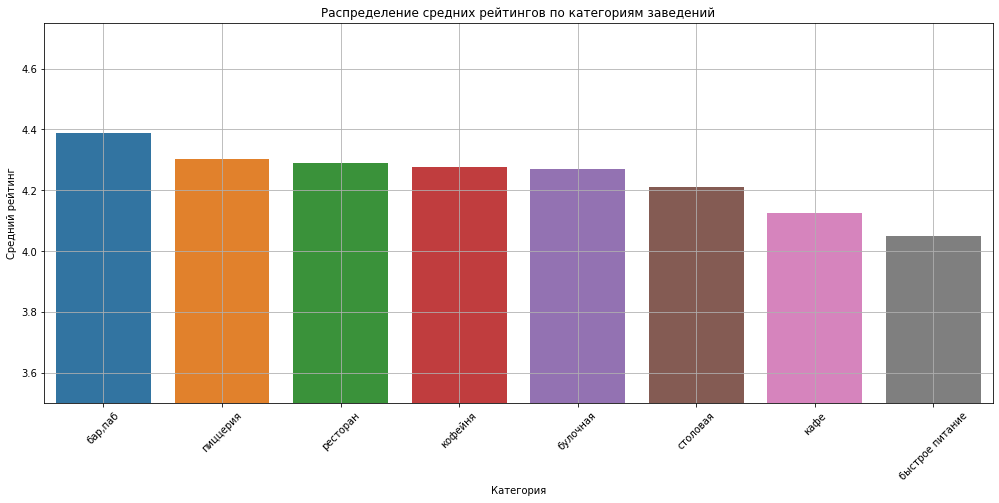

In [83]:
plt.figure(figsize=(17, 7))
sns.barplot(
    x='category', 
    y='rating', 
    data=df.groupby('category')['rating'].mean().reset_index().sort_values(by='rating', ascending=False)) 
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.ylim(3.5,4.75)
plt.xticks(rotation=45)
plt.grid();

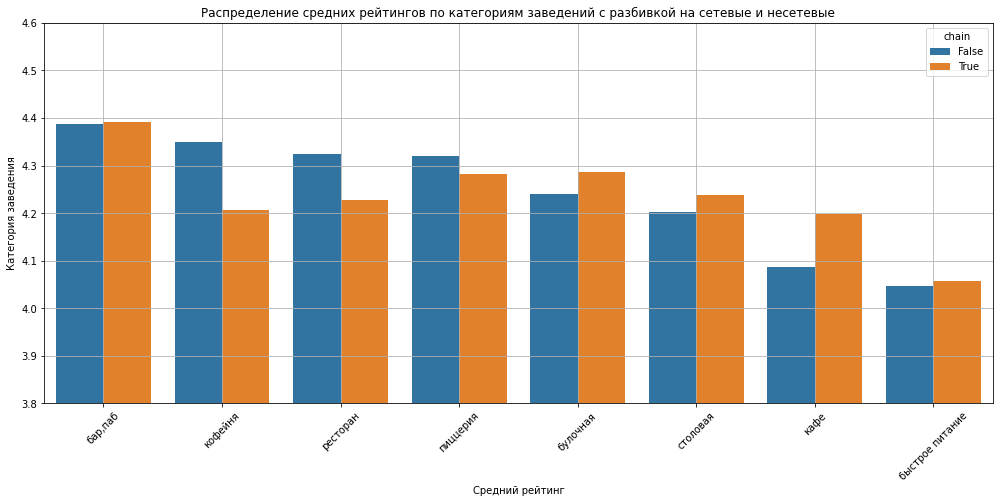

In [84]:
plt.figure(figsize=(17, 7))
sns.barplot(data=df.groupby(['category', 'chain'])['rating'].mean().reset_index().sort_values(by='rating',ascending=False), 
            x="category", 
            y="rating", 
            hue='chain')
plt.ylim(3.8,4.6)
plt.xticks(rotation=45)
plt.title('Распределение средних рейтингов по категориям заведений с разбивкой на сетевые и несетевые')
plt.grid()
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория заведения');

Самые высокие рейтинги у баров и пабов, медианное значение почти 4,4, а самые низкие у заведений быстрого питания примерно 4,05. При этом у сетевых ресторанов и кофеен рейтинги примерно на 0,1 балла меньше чем у несетевых, а с кафе ситуация обратная: сетевые заведения выигрывают на 0,1 балла по сравнению с несетевыми.

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района<a id="analysis61"></a>
[К содержанию](#intro)

In [85]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [86]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [87]:
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги в центральном, северном и северо-западном округах, самые низкие в юго-восточном.

### Отобразите все заведения датасета на карте<a id="analysis7"></a>
[К содержанию](#intro)

In [88]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']} {row['rating']} {row['price']}", 
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

Большая часть заведений сосредоточена в центре.

### Найдите топ-15 улиц по количеству заведений<a id="analysis8"></a>
[К содержанию](#intro)

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [89]:
df_top_15_streets = df.groupby('street')['name'].count().reset_index().sort_values(by='name', ascending=False).head(15)
df_top_15_streets

,street,name
1093,проспект Мира,184
777,Профсоюзная улица,122
1090,проспект Вернадского,108
529,Ленинский проспект,107
527,Ленинградский проспект,95
377,Дмитровское шоссе,88
459,Каширское шоссе,77
300,Варшавское шоссе,76
528,Ленинградское шоссе,70
554,МКАД,65


In [90]:
df_top_streets = df.query('street in @df_top_15_streets["street"]')
df_top_streets

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,низкие,Средний счёт:от 500 ₽,500.0,0.0,0.0,False,79.0,Дмитровское шоссе,False,500.0
12,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,0.0,0.0,False,NaN,МКАД,False,330.0
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,низкие,Средний счёт:350–500 ₽,425.0,0.0,0.0,False,96.0,Ленинградское шоссе,True,425.0
26,пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00–22:00",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,0.0,0.0,False,NaN,Дмитровское шоссе,False,900.0
28,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,0.0,0.0,False,NaN,МКАД,False,500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Люблинская улица,False,0.0
8396,пекинский двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,0.0,0.0,False,200.0,Ленинский проспект,False,1250.0
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,неизвестно,NaN,0.0,0.0,0.0,False,86.0,Профсоюзная улица,False,0.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,низкие,Средний счёт:от 150 ₽,150.0,0.0,0.0,False,150.0,Люблинская улица,True,150.0


In [91]:
df_street = df_top_streets.groupby(['street', 'category'])['name'].count().reset_index().sort_values(['street', 'name'])
fig = px.bar(df_street, x='street', y='name', color='category', text='category', title='Распределение заведений на самых популярных улиц')
fig.update_layout(width=1000, # указываем размеры графика
                  height=800)
fig.update_xaxes(title_text='Улица') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений')
fig.show()

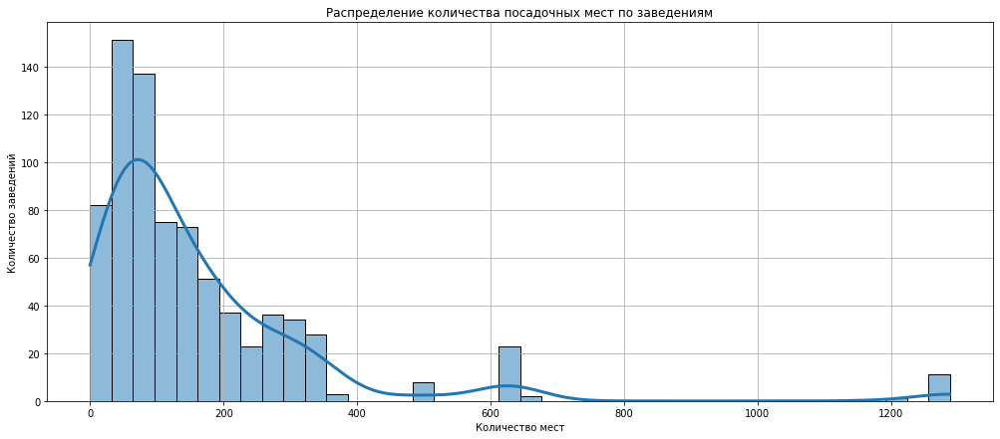

In [92]:
plt.figure(figsize=(17,7))
sns.histplot(x='seats', data=df_top_streets, kde=True, line_kws={'lw': 3})
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества посадочных мест по заведениям')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.xlim()
plt.grid()
# отображаем график на экране
plt.show()

Самое большое количество заведение на Проспекте мира, далее Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект и Дмитровское шосее. 
 
Все улицы попавшие в топ-15 довольно протяженные, частично большон количество заведений объясняется этим.

на этих улицах довольно много крупных заведений, около 25 заведений с числом посадочных мест от 600 до 650, и около 15 заведений с числом посадочных мест от 1200.

### Найдите улицы, на которых находится только один объект общепита<a id="analysis9"></a>
[К содержанию](#intro)

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [93]:
df_1_street = df.groupby('street')['name'].count().reset_index()
df_1_street = df_1_street.query('name == 1')
df_1_street

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1444,улица Чистова,1
1447,улица Шкулёва,1
1448,улица Шкулёва 4,1
1450,улица Шухова,1


In [94]:
df_1_streets = df.query('street in @df_1_street["street"]')
load(df_1_streets)

Первые 10 строк таблицы:



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,0.0,0.0,False,180.0,улица Бусиновская Горка,False,400.0
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Прибрежный проезд,False,0.0
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,неизвестно,NaN,0.0,0.0,0.0,True,NaN,парк Левобережный,False,0.0
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,0.0,0.0,True,NaN,Угличская улица,False,650.0
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,неизвестно,NaN,0.0,0.0,0.0,True,NaN,ландшафтный заказник Лианозовский,False,0.0
64,testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Лианозовский парк культуры и отдыха,False,0.0
71,cofefest,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,неизвестно,NaN,0.0,0.0,0.0,True,NaN,Новгородская улица,False,0.0
73,веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,неизвестно,NaN,0.0,0.0,0.0,True,NaN,парк Алтуфьево,False,0.0
97,жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00–00:00",55.879733,37.593734,4.5,низкие,Цена бокала пива:90–230 ₽,0.0,0.0,160.0,False,NaN,Бибиревская улица,False,160.0
103,тетри,быстрое питание,"Москва, Лианозовский проезд, вл1",Северо-Восточный административный округ,вт-вс 09:00–19:00,55.896922,37.554929,4.0,низкие,Средний счёт:150–250 ₽,200.0,0.0,0.0,False,NaN,Лианозовский проезд,False,200.0



Иноформация о таблице:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 467 entries, 15 to 8400
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               467 non-null    object 
 1   category           467 non-null    object 
 2   address            467 non-null    object 
 3   district           467 non-null    object 
 4   hours              441 non-null    object 
 5   lat                467 non-null    float64
 6   lng                467 non-null    float64
 7   rating             467 non-null    float64
 8   price              467 non-null    object 
 9   avg_bill           195 non-null    object 
 10  middle_avg_bill    467 non-null    float64
 11  middle_coffee_cup  467 non-null    float64
 12  middle_pint        467 non-null    float64
 13  chain              467 non-null    bool   
 14  seats              156 non-null    float64
 15  street             467 non-null    object 
 16 

None


Количество дубликатов в таблице:



0


Количество пропусков в таблице:



name                   0
category               0
address                0
district               0
hours                 26
lat                    0
lng                    0
rating                 0
price                  0
avg_bill             272
middle_avg_bill        0
middle_coffee_cup      0
middle_pint            0
chain                  0
seats                311
street                 0
is_24_7                0
avg                    0
dtype: int64


Процентное соотношение пропусков к общему числу значений для каждого столбца



,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,0.000000
avg_bill,58.000000


In [95]:
df_1_streets['category'].value_counts()

кафе               161
ресторан            93
кофейня             85
бар,паб             41
столовая            37
быстрое питание     25
пиццерия            15
булочная            10
Name: category, dtype: int64

In [96]:
fig = px.pie(df_1_streets.groupby('category')['name'].count().reset_index(), 
             values='name', 
             names='category', 
             title='Расперделение заведений по категориям')
fig.show()

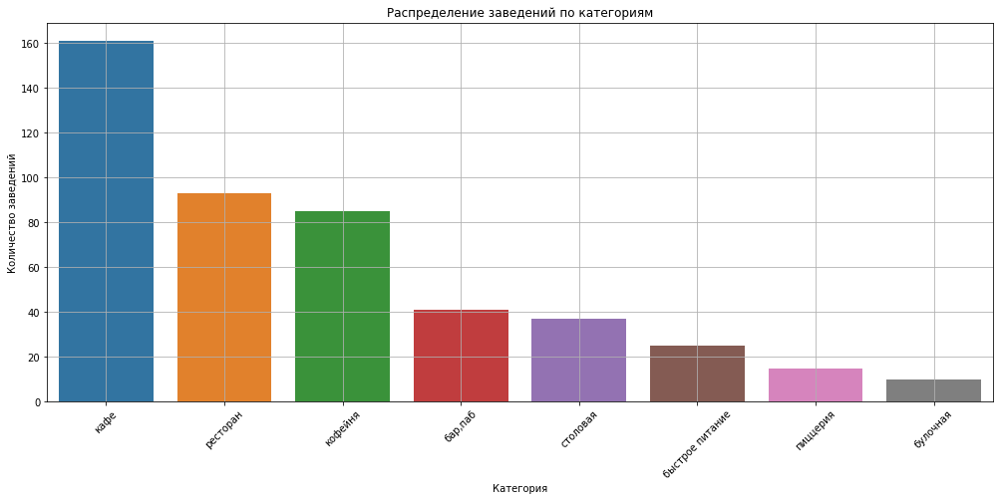

In [97]:
plt.figure(figsize=(17, 7))
sns.barplot(
    x='category', 
    y='name', 
    data=df_1_streets.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)) 
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.grid();

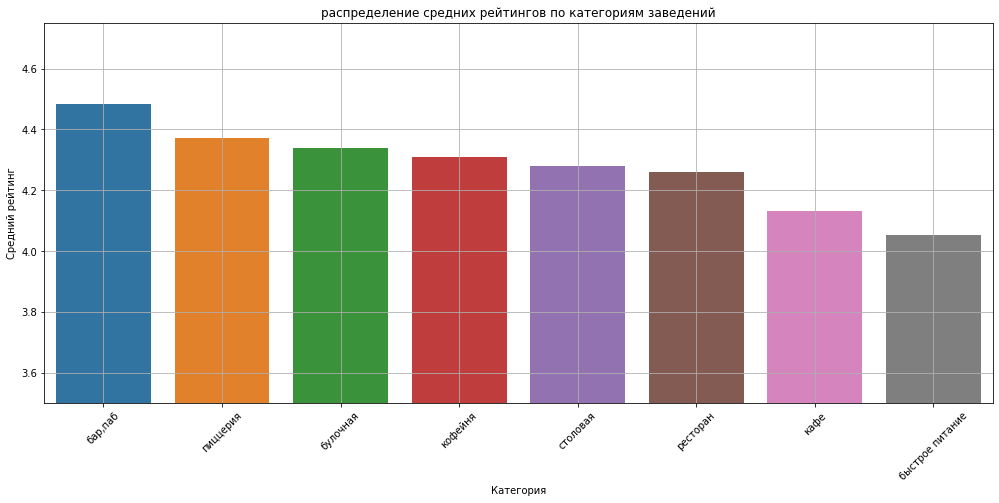

In [98]:
plt.figure(figsize=(17, 7))
sns.barplot(
    x='category', 
    y='rating', 
    data=df_1_streets.groupby('category')['rating'].mean().reset_index().sort_values(by='rating', ascending=False)) 
plt.title('распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.ylim(3.5,4.75)
plt.xticks(rotation=45)
plt.grid();

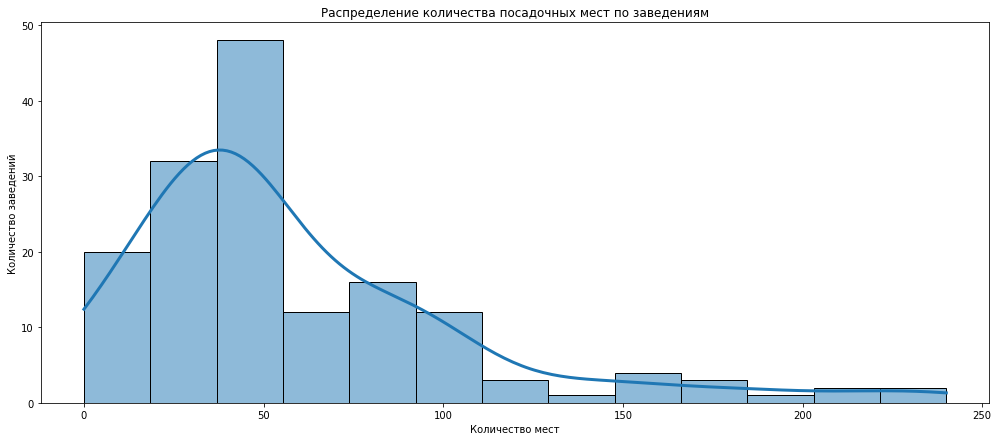

In [99]:
plt.figure(figsize=(17,7))
sns.histplot(x='seats', data=df_1_streets, kde=True, line_kws={'lw': 3})
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества посадочных мест по заведениям')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.xlim()
# отображаем график на экране
plt.show()

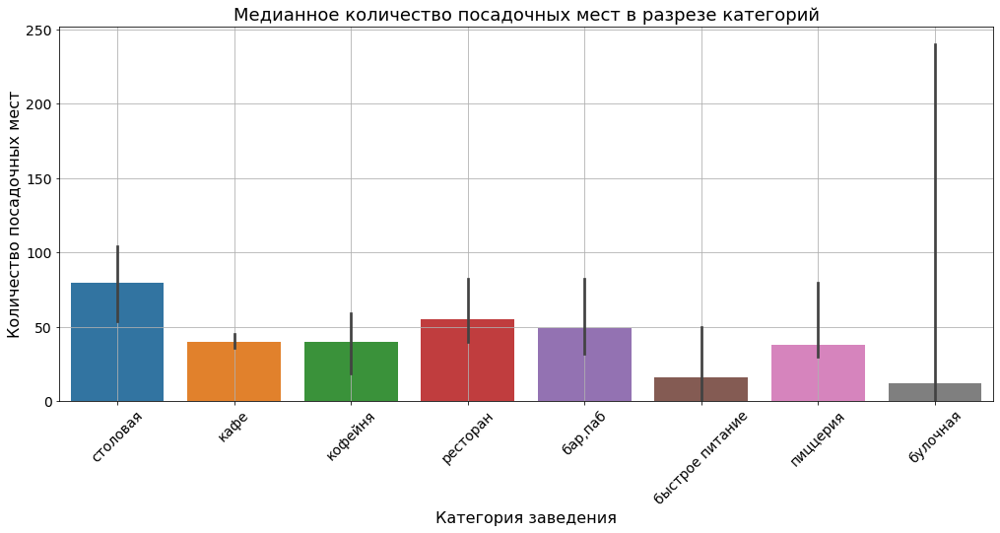

In [100]:
plt.figure(figsize=(17, 7))
sns.barplot(data=df_1_streets,x='category',y='seats',estimator=np.median)
plt.title('Медианное количество посадочных мест в разрезе категорий', fontsize=18)
plt.ylabel('Количество посадочных мест', fontsize=16)
plt.xlabel('Категория заведения', fontsize=16)
plt.grid()
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14);

In [101]:
df_1_streets[df_1_streets['category']=='булочная']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
177,арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,неизвестно,NaN,0.0,0.0,0.0,True,0.0,улица 8,False,0.0
1972,буханка,булочная,"Москва, улица Полины Осипенко, 10, корп. 1",Северный административный округ,"ежедневно, 07:00–23:00",55.780418,37.534420,4.7,неизвестно,NaN,0.0,0.0,0.0,True,10.0,улица Полины Осипенко,False,0.0
2821,я щамс,булочная,"Москва, Восточный административный округ, район Восточный, Главная улица, 21А",Восточный административный округ,"ежедневно, 09:00–21:00",55.821211,37.870185,4.5,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Главная улица,False,0.0
3082,испанские пончики чуррос,булочная,"Москва, Западный административный округ, район Крылатское, улица Крылатская, 18",Западный административный округ,пн-чт 10:00–22:00; пт-вс 10:00–23:00,55.771874,37.435601,4.2,неизвестно,NaN,0.0,0.0,0.0,False,NaN,улица Крылатская,False,0.0
3259,plov time,булочная,"Москва, улица Пивченкова, 7",Западный административный округ,"ежедневно, 09:00–22:00",55.735520,37.475576,4.4,неизвестно,NaN,0.0,0.0,0.0,False,12.0,улица Пивченкова,False,0.0
4387,осетинские пироги pir & rog,булочная,"Москва, Дурасовский переулок, 1, стр. 1",Центральный административный округ,"ежедневно, 10:00–20:00",55.755039,37.648942,4.9,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Дурасовский переулок,False,0.0
4649,барави,булочная,"Москва, Мясницкий проезд, 2/1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–20:00",55.767964,37.646427,4.3,неизвестно,NaN,0.0,0.0,0.0,False,36.0,Мясницкий проезд,False,0.0
5832,пекарня буханка,булочная,"Москва, 2-й переулок Петра Алексеева, 5",Западный административный округ,"ежедневно, 09:00–20:00",55.717888,37.429627,4.5,неизвестно,NaN,0.0,0.0,0.0,True,NaN,2-й переулок Петра Алексеева,False,0.0
7013,пекарня,булочная,"Москва, парк Зюзино",Юго-Западный административный округ,вт-вс 12:00–20:00,55.648510,37.586890,3.8,неизвестно,NaN,0.0,0.0,0.0,True,NaN,парк Зюзино,False,0.0
7260,бистро,булочная,"Москва, Ереванская улица, 28, корп. 1",Южный административный округ,"ежедневно, круглосуточно",55.627945,37.678431,4.1,неизвестно,NaN,0.0,0.0,0.0,False,240.0,Ереванская улица,True,0.0


In [102]:
fig = px.bar(df_1_streets.groupby('chain')['name'].count().reset_index(),
             x='name',
             y='chain',
             text='name')
# оформляем график
fig.update_layout(title='Соотношение количества сетевых и несетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения (сетевое/несетевое)')
fig.show() # выводим график

In [103]:
fig = px.bar(df_1_streets.groupby('is_24_7')['name'].count().reset_index(),
             x='name',
             y='is_24_7',
             text='name')
# оформляем график
fig.update_layout(title='Соотношение количества круглосуточных и обычных заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения (Круглосуточное/обычное)')
fig.show() # выводим график

Есть 467 улиц, на которых располагается только одно заведение, три четверти от них это кафе, рестораны и кофейни. Это небольшие заведения в них не более 250 мест, в среднем 50. Рейтинги распределены примерно так же как и по Москве в целом. В основном это несетевые заведения, почти все некруглосуточные.

### Как удалённость от центра влияет на цены в заведениях?<a id="analysis10"></a>
[К содержанию](#intro)

In [104]:
price_df = df.groupby('district', as_index=False)['avg'].agg('mean')
price_df

,district,avg
0,Восточный административный округ,279.015664
1,Западный административный округ,392.019976
2,Северный административный округ,350.293333
3,Северо-Восточный административный округ,255.470819
4,Северо-Западный административный округ,328.006112
5,Центральный административный округ,586.516949
6,Юго-Восточный административный округ,187.992997
7,Юго-Западный административный округ,273.976023
8,Южный административный округ,305.981502


In [105]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_df,
    columns=['district', 'avg'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самые дорогие заведения располагаются в центральном, западном, северо-западном и северном округах. Самые дешевые в юго-восточном

### Вывод по разделу<a id="analysis"></a>
[К содержанию](#intro)

В таблице представлены 8 категорий заведений : "кафе", "ресторан", "кофейня", "бар,паб","пиццерия","быстрое питание","столовая" и "булочная". Кафе и рестораны составляют больше половины всех заведений Москвы. Четверть занимают кофейни и бары, и еще четверть приходитсяна пиццерии, заведения быстрого питания, столовые и булочные. Для визуализации использована интерактивная круговая диаграмма, так как она позволяет наглядно показать доли от общего количества и абсолютное количество заведений.

Заведения Москвы с указанным количеством мест (около трети этих данных пропущено) могут одновременно вместить более полумиллиона человек, это около 4% от населения Москвы на 2022 год. При этом больше половины посадочных мест находятся в кафе и ресторанах. Выпить в барах и пабах Москвы могут одновременно 58 тысяч человек, а поужинать в ресторанах почти 155 тысяч.

Пик количества посадочных мест приходится на 40-60.

Самыми вместительными оказались рестораны, бары и кофейни (окло 80 мест в заведении), меньше всего людей вмещают булочные и пиццерии (около 50)

В несетевых барах и пиццериях медианное количество мест немного больше, а в остальных 6 категориях сетевые заведения более вместительны, особенно это касается кофеен и заведений быстрого питания.

В круглосуточных барах и булочных медианное количество мест немного больше, в кофейнях разницы почти нет, а в остальных 5 категориях некруглосуточные заведения более вместительны, особенно это касается столовых и заведений быстрого питания.

Несетевых заведений на 2000 больше чем несетевых. В процентном соотношении cетевые заведения составляют 38.1% а несетевые 61.9%.

Сетевые булочные, кофейни и пиццерии встречаются немного чаше чем несетевые. Несетевых кафе, ресторанов и баров гораздо больше чем стевых

Более трети самых популярных сетевых заведений занимают кофейни. Самая популярная сеть кофеен "Шоколадница" насчитывает 119 заведений в Москве, далее две пицерии Доминос(76) и До-до(74).

Если считать заведения, а не категории, то кофейни составляют уже 45,6%, рестораны 20,1%, а пиццерии 19,5%.

В среднем в заведениях топ-15 сетей около 60 мест, меньше всего в До-до (40), больше всего в Кофемании(120)

Медианные рейтинги от 4,0 до 4,4. Ниже всего у Яндекс лавки и Сofefest, самые высокие у Братьев Караваевых, Буханки и Кофемании.

Если ценовая категория известна, в 53% случаев она относится к низким, в 27 к средним, и в 7% к категории выше среднего

В таблице представлено 9 административных районов Москвы:Центральный, Северный, Южный, Северо-Восточный, Западный, Восточный, Юго-Восточный, Юго-Западный, Северо-Западный.

В центральном округе заведений больше всего, меньше всего в Северо-Западном.

Во всех округах кроме Центрального самая обширная категория заведений - кафе, в Центральном самая популярная категория - ресторан, далее кафе, кофейни и бары. Кофейни обычно третья по численности группа (исключение - Северный АО, там кофейни на втором месте). Самые редкие заведения во всех районах - столовые и булочные.

В центральном округе на 1000 человек приходится 2,88 заведений и 184.47 посадочных мест, наблюдается высокая концентрация заведений при низкой численности населения. Большое количество заведений объясняется тем, что центральный округ является местом досуга для многих москвичей. Далее идут Северный, Северо-Восточный и Западный АО, там на 1000 человек приходися от 0,61 до 0,76 заведений и от 34 до 53 посадочных мест.

Самое низкое количество заведений на 1000 человек наблюдается в Северо-западном округе (0,4 заведения на 1000 чел), при этом количество посадочных мест там не минимальное, значит в том округе есть несколько крупных заведений. Далее идут Юго-Западный, Юго_восточный и Южный АО, там на 1000 человек приходится 0,5 заведения и от 20 до 35 посадочных мест. Скорее всего это связано с высокой плотностью населения в этих АО.

Распределение заведений по Москве непропорционально плотности населения, вероятно оно связано с уровнем дохода населения, транспортной доступностью, наличием пешеходных улиц, парков, развлекательных и торговых центров, достопримечательностей и других мест досуга.

Самые высокие рейтинги у баров и пабов, медианное значение почти 4,4, а самые низкие у заведений быстрого питания примерно 4,05. При этом у сетевых ресторанов и кофеен рейтинги примерно на 0,1 балла меньше чем у несетевых, а с кафе ситуация обратная: сетевые заведения выигрывают на 0,1 балла по сравнению с несетевыми.

Самые высокие рейтинги в центральном, северном и северо-западном округах, самые низкие в юго-восточном.

Большая часть заведений сосредоточена в центре.

Самое большое количество заведение на Проспекте мира, далее Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект и Дмитровское шосее. 
 
Все улицы попавшие в топ-15 довольно протяженные, частично большон количество заведений объясняется этим.

на этих улицах довольно много крупных заведений, около 25 заведений с числом посадочных мест от 600 до 650, и около 15 заведений с числом посадочных мест от 1200.

Есть 467 улиц, на которых располагается только одно заведение, три четверти от них это кафе, рестораны и кофейни. Это небольшие заведения в них не более 250 мест, в среднем 50. Рейтинги распределены примерно так же как и по Москве в целом. В основном это несетевые заведения, почти все некруглосуточные.

Самые дорогие заведения располагаются в центральном, западном, северо-западном и северном округах. Самые дешевые в юго-восточном

## Детализация исследование: открытие кофейни<a id="detailing"></a>
[К содержанию](#intro)

### Сколько всего кофеен в датасете? <a id="detailing1"></a>
[К содержанию](#intro)

In [106]:
df_cof = df[df['category']=='кофейня']
len(df_cof)

1413

Всего по данным датафрейма в Москве 1413 кофеен

### В каких районах их больше всего, каковы особенности их расположения?<a id="detailing2"></a>
[К содержанию](#intro)

In [107]:
df_cof.groupby('district')['name'].count().reset_index().sort_values(by='name', ascending=False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


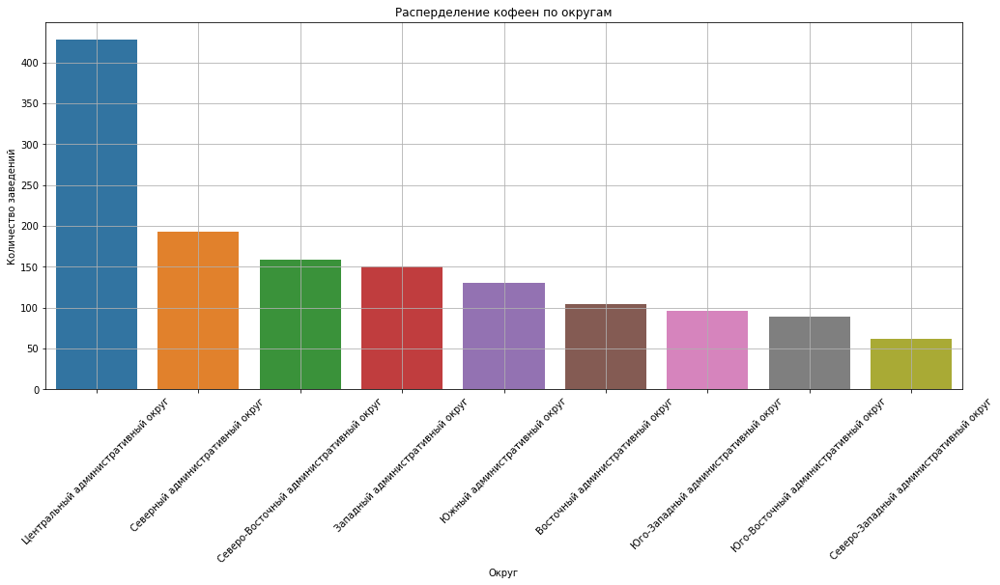

In [108]:
plt.figure(figsize=(17,7))
sns.barplot(x='district', y='name', data=df_cof.groupby('district')['name'].count().reset_index().sort_values(by='name', ascending=False))
plt.title('Расперделение кофеен по округам')
plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.grid()
plt.xticks(rotation=45)
plt.show()

In [109]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_cof.groupby('district')['name'].count().reset_index(),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m)

# выводим карту
m

In [110]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['price']} {row['rating']} {row['hours']} {row['seats']}", 
    ).add_to(marker_cluster)

df_cof.apply(create_clusters, axis=1)

m

In [111]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_cof.groupby('district', as_index=False)['avg'].agg('mean'),
    columns=['district', 'avg'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек кофеен заведений по районам',
).add_to(m)

# выводим карту
m

Больше всего кофеен в центральном округе (30,3% от общего количества), на втором месте по числу кофеен северный округ (13,7%), на третьем северо-восточный (11,3%). Меньше всего кофеен расположено в юго-восточном и северо-западном округах.

Самые дорогие заведения находятся в центре и на западе Москвы, самые дешевые на юго-западе и юго-востоке.

### Есть ли круглосуточные кофейни?<a id="detailing3"></a>
[К содержанию](#intro)

In [112]:
df_cof.groupby('is_24_7')['name'].count()

is_24_7
False    1354
True       59
Name: name, dtype: int64

In [113]:
df_cof_24 = df_cof[df_cof['is_24_7']==True]
df_cof_24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
200,wild bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,неизвестно,NaN,0.0,0.0,0.0,True,20.0,Дмитровское шоссе,True,0.0
971,wild bean cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,неизвестно,NaN,0.0,0.0,0.0,True,25.0,Ярославское шоссе,True,0.0
1047,wild bean cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,низкие,Цена чашки капучино:140–200 ₽,0.0,170.0,0.0,True,NaN,Ярославское шоссе,True,170.0
1214,wild bean cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,неизвестно,NaN,0.0,0.0,0.0,True,NaN,МКАД,True,0.0
1291,шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,0.0,0.0,True,200.0,улица Народного Ополчения,True,750.0
1468,кофе хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,средние,Цена чашки капучино:235–335 ₽,0.0,285.0,0.0,True,NaN,Ленинградский проспект,True,285.0
1790,кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,неизвестно,NaN,0.0,0.0,0.0,True,15.0,Ленинградский проспект,True,0.0
1825,you&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,неизвестно,NaN,0.0,0.0,0.0,True,NaN,улица Золоторожский Вал,True,0.0
1883,кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,0.0,0.0,True,140.0,Лесная улица,True,2000.0
2030,cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,неизвестно,NaN,0.0,0.0,0.0,True,230.0,Долгоруковская улица,True,0.0


In [114]:
df_cof_24.groupby('district')['name'].count().reset_index().sort_values(by='name', ascending=False)

,district,name
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [115]:
df_cof_24.groupby('chain')['name'].count().reset_index().sort_values(by='name', ascending=False)

,chain,name
1,True,50
0,False,9


In [116]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['price']} {row['rating']} {row['hours']} {row['seats']}", 
    ).add_to(marker_cluster)

df_cof_24.apply(create_clusters, axis=1)

m

In [117]:
df_cof_24['name'].value_counts()

шоколадница           17
кофемания              8
wild bean cafe         6
wild bean              5
кофе хауз              3
cofix                  2
you&coffee             2
кофе с собой           2
молоко                 1
one price coffee       1
кофе on                1
one&double             1
столица                1
one more, please       1
foodmoscowcoffee       1
cinnabon               1
one and double         1
пирог хауз             1
кофейня one&double     1
the wild bean cafe     1
гоголь-моголь          1
лаванда кофе           1
Name: name, dtype: int64

Есть 59 круглосуточных кофеен, почти половина расположена в центральном округе, и всего по одной в юго-восточном и южном округах. Сетевых круглосуточных кофеен зачительно больше чем несетевых, 50 против 9. Больше всего круглосуточных кофеен принадлежит к сети "шоколадница" их 17, есть 12 круглосуточных кофеен "wild bean" и  8 кофеен сети "кофемания".

### Какие у кофеен рейтинги?<a id="detailing4"></a>
[К содержанию](#intro)

In [118]:
df_cof['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

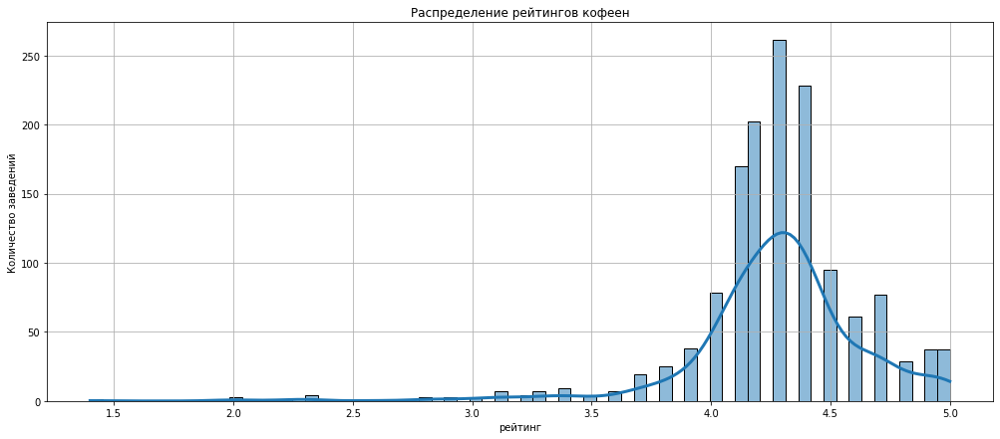

In [119]:
plt.figure(figsize=(17,7))
sns.histplot(x='rating', data=df_cof, kde=True, line_kws={'lw': 3})
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение рейтингов кофеен')
plt.xlabel('рейтинг')
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

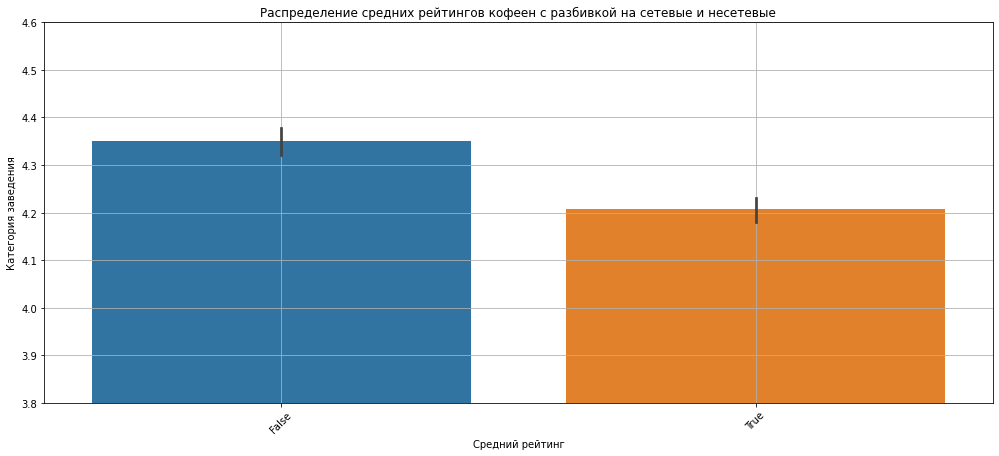

In [120]:
plt.figure(figsize=(17, 7))
sns.barplot(data=df_cof, x="chain", y="rating", estimator=np.mean)
plt.ylim(3.8,4.6)
plt.xticks(rotation=45)
plt.title('Распределение средних рейтингов кофеен с разбивкой на сетевые и несетевые')
plt.grid()
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория заведения');

In [121]:
df_cof_max_rat = df_cof[df_cof['rating']==5]
df_cof_max_rat 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,0.0,170.0,0.0,False,NaN,улица Маршала Федоренко,False,170.0
324,иду лесом,кофейня,"Москва, Светлогорский проезд, 13, стр. 7",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.848242,37.402168,5.0,низкие,Цена чашки капучино:150–180 ₽,0.0,165.0,0.0,False,NaN,Светлогорский проезд,False,165.0
392,кеклик,кофейня,"Москва, Смольная улица, 49",Северный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.863665,37.478497,5.0,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Смольная улица,False,0.0
610,напитки со всего мира,кофейня,"Москва, Головинское шоссе, 5А",Северный административный округ,"ежедневно, 10:00–22:00",55.839592,37.490370,5.0,неизвестно,NaN,0.0,0.0,0.0,False,NaN,Головинское шоссе,False,0.0
1272,уголок,кофейня,"Москва, улица Космонавта Волкова, 6А",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.815341,37.513262,5.0,неизвестно,NaN,0.0,0.0,0.0,True,180.0,улица Космонавта Волкова,False,0.0
1283,pique-nique,кофейня,"Москва, 3-я Радиаторская улица, 9",Северный административный округ,"ежедневно, 09:00–22:00",55.818584,37.490628,5.0,низкие,Цена чашки капучино:170–220 ₽,0.0,195.0,0.0,False,NaN,3-я Радиаторская улица,False,195.0
1284,стамбул дурум,кофейня,"Москва, улица Народного Ополчения, 22",Северо-Западный административный округ,"ежедневно, 11:00–23:00",55.778556,37.479573,5.0,средние,Средний счёт:250–300 ₽,275.0,0.0,0.0,False,NaN,улица Народного Ополчения,False,275.0
1296,bread head,кофейня,"Москва, бульвар Генерала Карбышева, 15",Северо-Западный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–22:00",55.781952,37.470147,5.0,неизвестно,NaN,0.0,0.0,0.0,False,NaN,бульвар Генерала Карбышева,False,0.0
1307,nero bean coffee roastery,кофейня,"Москва, Ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.809720,37.507711,5.0,низкие,Цена чашки капучино:150–250 ₽,0.0,200.0,0.0,False,232.0,Ленинградский проспект,False,200.0
1569,дайтекофе,кофейня,"Москва, Ходынский бульвар, 4",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.790835,37.528564,5.0,неизвестно,NaN,0.0,0.0,0.0,False,100.0,Ходынский бульвар,False,0.0


In [122]:
df_cof_max_rat['chain'].value_counts()

False    30
True      7
Name: chain, dtype: int64

In [123]:
df_cof_max_rat['is_24_7'].value_counts()

False    36
True      1
Name: is_24_7, dtype: int64

Средний рейтинг кофеен 4.3, средний рейтинг несетевых кофеен выше чем у сетевых. Есть 37 кофеен с максимальным рейтингом, из них 30 сетевых, и всего 1 круглосуточная.

### Как рейтинги распределяются по районам?<a id="detailing5"></a>
[К содержанию](#intro)

In [124]:
df_cof.groupby('district')['rating'].mean().reset_index().sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


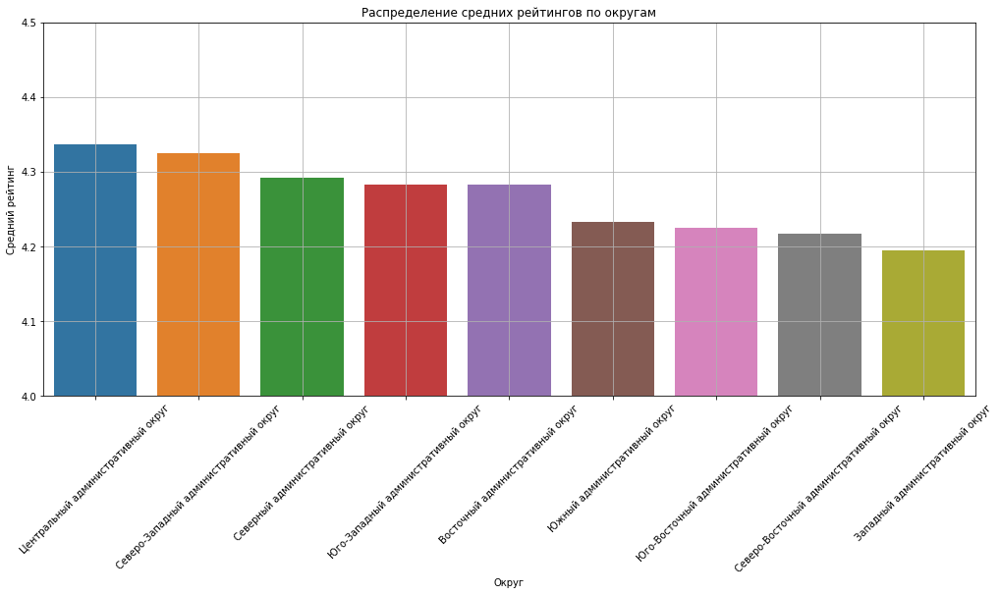

In [125]:
plt.figure(figsize=(17, 7))
sns.barplot(
    x='district', 
    y='rating', 
    data=df_cof.groupby('district')['rating'].mean().reset_index().sort_values(by='rating', ascending=False)) 
plt.title('Распределение средних рейтингов по округам')
plt.xlabel('Округ')
plt.ylabel('Средний рейтинг')
plt.ylim(4,4.5)
plt.xticks(rotation=45)
plt.grid();

In [126]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_cof.groupby('district')['rating'].mean().reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейинги в Центральном и Северо-Западном АО, далее Северный и Юго-Западный. Самые низкие рейтиги в Западном АО.

### Сколько в среднем посадочных мест в в кофейнях?

In [127]:
df_cof['seats'].describe()

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

In [128]:
x_values = pd.Series(range(0, len(df_cof)))
fig = px.scatter(df_cof,
                 x=x_values,
                 y='seats', opacity=0.5)

fig.update_layout(title='Точечная диаграмма распределения количества посадочных мест в заведениях',
                   xaxis_title='',
                   yaxis_title='Количество посадочных мест')

fig.show()

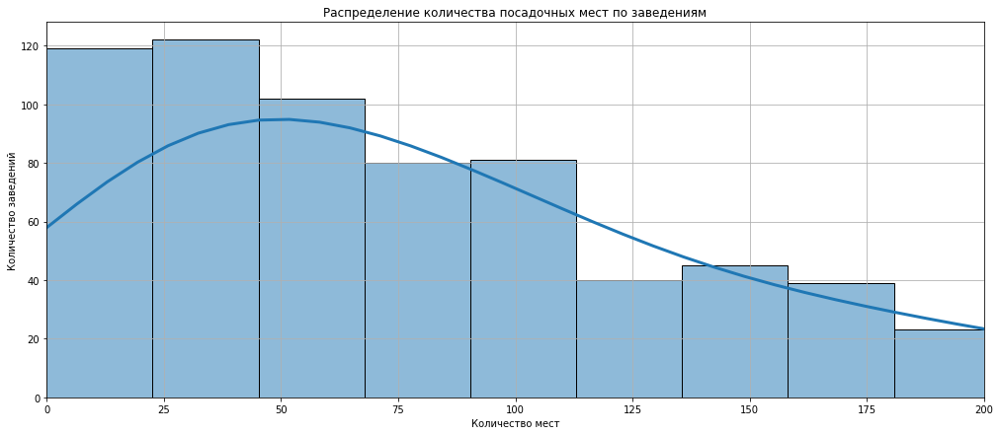

In [129]:
plt.figure(figsize=(17,7))
sns.histplot(x='seats', data=df_cof, kde=True, line_kws={'lw': 3})
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества посадочных мест по заведениям')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.xlim(0,200)
plt.grid()
# отображаем график на экране
plt.show()

Есть две кофейни с числом посадочных мест более 1200, но в основном мест в кофейнях от 40 до 140, медианное значение 80.

На графике пик числа посадочных мест приходится на промежуток 25-50 мест

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?<a id="detailing6"></a>
[К содержанию](#intro)

In [130]:
df_cof[df_cof['middle_coffee_cup']!=0]['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [131]:
df_cof[df_cof['middle_coffee_cup']==1568]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,middle_pint,chain,seats,street,is_24_7,avg
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,высокие,Цена чашки капучино:230–2907 ₽,0.0,1568.0,0.0,True,48.0,Большая Семёновская улица,False,1568.0


In [132]:
#df_cof[df_cof['middle_coffee_cup']!=0 & df_cof['middle_coffee_cup']==1568]['middle_coffee_cup'].describe()
df_cof.query('middle_coffee_cup != 0 & middle_coffee_cup !=1568')['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

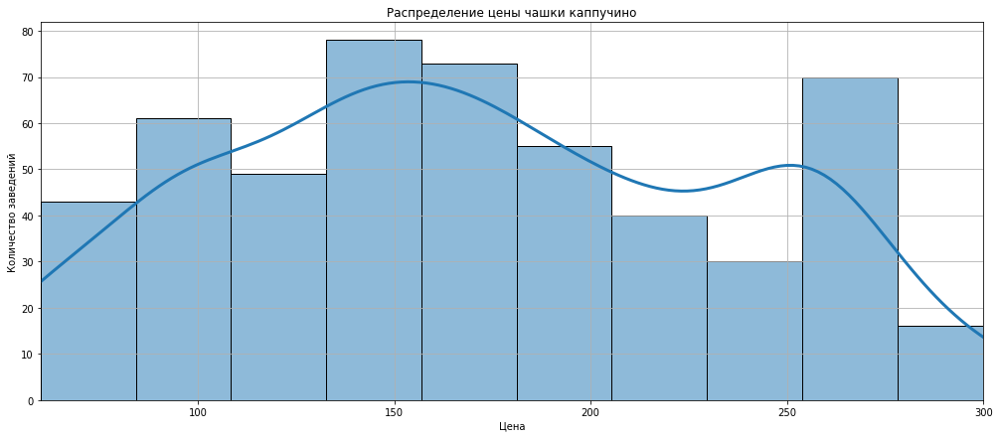

In [133]:
plt.figure(figsize=(17,7))
sns.histplot(x='middle_coffee_cup', data=df_cof.query('middle_coffee_cup != 0 & middle_coffee_cup !=1568'), kde=True, line_kws={'lw': 3})
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение цены чашки каппучино')
plt.xlabel('Цена')
plt.ylabel('Количество заведений')
plt.grid()
plt.xlim(60,300)
plt.show()

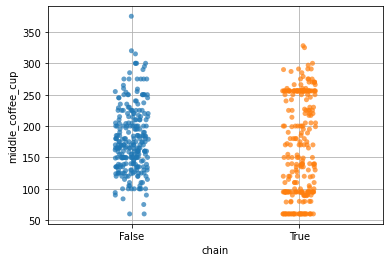

In [134]:
sns.stripplot(x='chain', y='middle_coffee_cup', data=df_cof.query('middle_coffee_cup != 0 & middle_coffee_cup !=1568'), alpha=0.7) 
plt.grid(True)

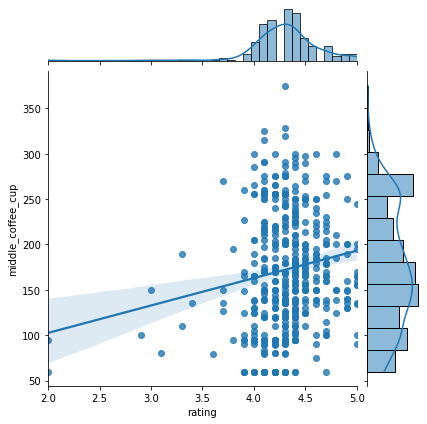

In [135]:
sns.jointplot(x='rating', y='middle_coffee_cup', data=df_cof.query('middle_coffee_cup != 0 & middle_coffee_cup !=1568'), kind='reg') ;

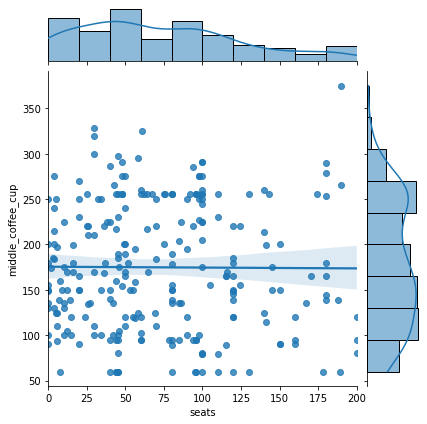

In [136]:
sns.jointplot(
    x='seats', 
    y='middle_coffee_cup', 
    data=df_cof.query('middle_coffee_cup != 0 & middle_coffee_cup !=1568 & seats <= 200'), kind='reg') ;

Средняя и медианная цены чашки каппучино после удаления выброса и нулевых значений почти равны, около 170 рублей, в целом можно ориентироваться на цену ниже этого значения, однако ориентировочная цена чашки каппучино зависит от формата заедения. 

С повышением цены немного увеличивается рейтинг, а вот от количества посадочных мест средняя ена не зависит.

У стевых кофеен распространены цены примерно в 60, 100 и 250 рублей. В несетевых цены в основном от 100 до 300 рублей.

### Вывод по разделу<a id="detailing7"></a>
[К содержанию](#intro)

Всего по данным датафрейма в Москве 1413 кофеен

Больше всего кофеен в центральном округе (30,3% от общего количества), на втором месте по числу кофеен северный округ (13,7%), на третьем северо-восточный (11,3%). Меньше всего кофеен расположено в юго-восточном и северо-западном округах.

Самые дорогие заведения располагаются в центральном, западном, северо-западном и северном округах. Самые дешевые в юго-восточном.

Есть 59 круглосуточных кофеен, почти половина расположена в центральном округе, и всего по одной в юго-восточном и южном округах. Сетевых круглосуточных кофеен зачительно больше чем несетевых, 50 против 9. Больше всего круглосуточных кофеен принадлежит к сети "шоколадница" их 17, есть 12 круглосуточных кофеен "wild bean" и 8 кофеен сети "кофемания".

Средний рейтинг кофеен 4.3, средний рейтинг несетевых кофеен выше чем у сетевых. Есть 37 кофеен с максимальным рейтингом, из них 30 сетевых, и всего 1 круглосуточная.

Самые высокие рейинги в Центральном и Северо-Западном АО, далее Северный и Юго-Западный. Самые низкие рейтиги в Западном АО.

Средняя и медианная цены чашки каппучино после удаления выброса и нулевых значений почти равны, около 170 рублей, в целом можно ориентироваться на цену ниже этого значения, однако ориентировочная цена чашки каппучино зависит от формата заедения. 

С повышением цены немного увеличивается рейтинг, а вот от количества посадочных мест средняя цена не зависит.

Есть две кофейни с числом посадочных мест более 1200, но в основном мест в кофейнях от 40 до 140, медианное значение 80.

На графике пик числа посадочных мест приходится на промежуток 25-50 мест

У сетевых кофеен распространены цены примерно в 60, 100 и 250 рублей. В несетевых цены в основном от 100 до 300 рублей.


В центральном округе очень много кофеен, новое заведение столкнется с большой конкуренцией. Наиболее перспективны для нового заведения будут места вблизи университетов, бизнес-центров, мест отдыха и досуга, в пешей доступности от метро во всех округах кроме центрального, но на небольшом удалении от него. Для юго-востока и юго-запада Москвы подойдет заведение с низкими ценами до 150р, для остальных цены могут быть средними 150-200. Так как многие выбирают заведения по по рейтингам, необходимо стремиться к рейтингу выше 4,7. В Северо-Западном, Северном и Юго-Западном округах средние рейтинги кофеен достаточно высокие, с ними будет сложно конкурировать, а вот в Западном округе средний рейтинг минимальный по Москве. 

## Презентация<a id="presentation"></a>
[К содержанию](#intro)

Презентация: <https://disk.yandex.ru/i/NWHODnOglN5mhQ> 

## Общий вывод по исследованию<a id="conclusion"></a>
[К содержанию](#intro)

В таблице данные о 8406 заведениях, из которых 5614 уникальных, вероятно остальные заведения сетевые.

Есть пропуски в столбцах hours, priceб avg_bill, middle_avg_bill, middle_coffee_cup и seats.

Полные дубликаты отсутствуют.

Есть 8 категорий заведений(в порядке убывания количества заведений): "кафе", "ресторан", "кофейня", "бар,паб","пиццерия","быстрое питание","столовая" и "булочная".

Существует 1307 разных режимов работы, наиболее популярные (в порядке убывания количества заведений): "ежедневно, 10:00–22:00", "ежедневно, круглосуточно", "ежедневно, 11:00–23:00", "ежедневно, 10:00–23:00", "ежедневно, 12:00–00:00".

Наиболее распространенные рейтинги заведений от 4,1 до 4,5.

Представлены 4 категории цен (в порядке убывания количества заведений): "средние", "выше среднего", "высокие", "низкие".

Есть 5201 несетевое заведение и 3205 сетевое.

Представлены данные по 9 административным округам, больше всего заведений располагается в Центральном, меньше всего в Северо-Западном.

Количество посадочных мест варьируется от 0 до 1288, медианное значение - 75, большая часть заведений вмещает не более 200 человек.

Было создано 4 новых столбца: "midle_pint" со средней стоимостью бокала пива, "street" с названием улицы, где находится заведение, "is_24_7" со значениями true-заведение является круглосуточным, false-заведение не является круглосуточным, и "avg" - единый столбец со средним чеком заведения (содержит средний чек, стоимость чашки кофе или стоимость бокала пива, в зависимости от того какие данные были в исходном файле).

Данные были приведены к оптимальным типам переменных

Данные были проверены на явные дубликаты и на дубликаты по паре значений название+адрес. Явных дубликатов в таблице нет, однако есть часто повтряющиеся названия, причем некоторые из заведений с одинаковыми названиями сетевые, а некоторые нет, так же есть похожие названия которые возможно принадлежат к одной сети (например сеть surf coffee представлена в датафрейме как несетевые кофейни с разными названиями). Поэтому качественно очистить данные от неявных дубликатов невозможно. Если бы в данных присутвовали уникальные идентификаторы сетей и заведений, можно было бы воспользоваться ими, например можно добавить столбец с ИНН организации, тогда можно было бы группировать данные по нему, наиболее точно выбрать сетевые и несетевые заведения и качественно избавиться от неявных дубликатов в названиях.

Есть 536 пропусков в часах работы, их не получится заполнить.

5091 пропуск в категории цен, если для этих строк есть значения диапозона среднего чека (avg_bill), их можно будет заполнить, задав категории цен для каждой категории заведения.

4590 пропусков в значениях диапозона среднего чека можно заполнить, если для этих строк есть категория цен.

5257 пропусков в middle_avg_bill можно заполнить если значение диапозона среднего чека начинается с подстроки "Средний счёт:"

7871 пропуск в middle_coffee_cup можно заполнить если значение диапозона среднего чека начинается с подстроки "Цена чашки капучино"

8274 пропуска в middle_pint можно заполнить если значение диапозона среднего чека начинается с подстроки "Цена бокала пива"

3611 пропусков в количестве посадочных мест заполнить не получится, однако стоит проверить, для каких категорий заведений отсутствуют эти данные.

27 пропусков в street не получится заполнить.

Были выбраны границы ценовых диапазонов для каждой категории и перезаполнены категории цен.


В таблице представлены 8 категорий заведений : "кафе", "ресторан", "кофейня", "бар,паб","пиццерия","быстрое питание","столовая" и "булочная". Кафе и рестораны составляют больше половины всех заведений Москвы. Четверть занимают кофейни и бары, и еще четверть приходитсяна пиццерии, заведения быстрого питания, столовые и булочные. Для визуализации использована интерактивная круговая диаграмма, так как она позволяет наглядно показать доли от общего количества и абсолютное количество заведений.

Заведения Москвы с указанным количеством мест (около трети этих данных пропущено) могут одновременно вместить более полумиллиона человек, это около 4% от населения Москвы на 2022 год. При этом больше половины посадочных мест находятся в кафе и ресторанах. Выпить в барах и пабах Москвы могут одновременно 58 тысяч человек, а поужинать в ресторанах почти 155 тысяч.

Пик количества посадочных мест приходится на 40-60.

Самыми вместительными оказались рестораны, бары и кофейни (окло 80 мест в заведении), меньше всего людей вмещают булочные и пиццерии (около 50)

В несетевых барах и пиццериях медианное количество мест немного больше, а в остальных 6 категориях сетевые заведения более вместительны, особенно это касается кофеен и заведений быстрого питания.

В круглосуточных барах и булочных медианное количество мест немного больше, в кофейнях разницы почти нет, а в остальных 5 категориях некруглосуточные заведения более вместительны, особенно это касается столовых и заведений быстрого питания.

Несетевых заведений на 2000 больше чем несетевых. В процентном соотношении cетевые заведения составляют 38.1% а несетевые 61.9%.

Сетевые булочные, кофейни и пиццерии встречаются немного чаше чем несетевые. Несетевых кафе, ресторанов и баров гораздо больше чем стевых

Более трети самых популярных сетевых заведений занимают кофейни. Самая популярная сеть кофеен "Шоколадница" насчитывает 119 заведений в Москве, далее две пицерии Доминос(76) и До-до(74).

Если считать заведения, а не категории, то кофейни составляют уже 45,6%, рестораны 20,1%, а пиццерии 19,5%.

В среднем в заведениях топ-15 сетей около 60 мест, меньше всего в До-до (40), больше всего в Кофемании(120)

Медианные рейтинги от 4,0 до 4,4. Ниже всего у Яндекс лавки и Сofefest, самые высокие у Братьев Караваевых, Буханки и Кофемании.

Если ценовая категория известна, в 53% случаев она относится к низким, в 27 к средним, и в 7% к категории выше среднего

В таблице представлено 9 административных районов Москвы:Центральный, Северный, Южный, Северо-Восточный, Западный, Восточный, Юго-Восточный, Юго-Западный, Северо-Западный.

В центральном округе заведений больше всего, меньше всего в Северо-Западном.

Во всех округах кроме Центрального самая обширная категория заведений - кафе, в Центральном самая популярная категория - ресторан, далее кафе, кофейни и бары. Кофейни обычно третья по численности группа (исключение - Северный АО, там кофейни на втором месте). Самые редкие заведения во всех районах - столовые и булочные.

В центральном округе на 1000 человек приходится 2,88 заведений и 184.47 посадочных мест, наблюдается высокая концентрация заведений при низкой численности населения. Большое количество заведений объясняется тем, что центральный округ является местом досуга для многих москвичей. Далее идут Северный, Северо-Восточный и Западный АО, там на 1000 человек приходися от 0,61 до 0,76 заведений и от 34 до 53 посадочных мест.

Самое низкое количество заведений на 1000 человек наблюдается в Северо-западном округе (0,4 заведения на 1000 чел), при этом количество посадочных мест там не минимальное, значит в том округе есть несколько крупных заведений. Далее идут Юго-Западный, Юго_восточный и Южный АО, там на 1000 человек приходится 0,5 заведения и от 20 до 35 посадочных мест. Скорее всего это связано с высокой плотностью населения в этих АО.

Распределение заведений по Москве непропорционально плотности населения, вероятно оно связано с уровнем дохода населения, транспортной доступностью, наличием пешеходных улиц, парков, развлекательных и торговых центров, достопримечательностей и других мест досуга.

Самые высокие рейтинги у баров и пабов, медианное значение почти 4,4, а самые низкие у заведений быстрого питания примерно 4,05. При этом у сетевых ресторанов и кофеен рейтинги примерно на 0,1 балла меньше чем у несетевых, а с кафе ситуация обратная: сетевые заведения выигрывают на 0,1 балла по сравнению с несетевыми.

Самые высокие рейтинги в центральном, северном и северо-западном округах, самые низкие в юго-восточном.

Самое большое количество заведение на Проспекте мира, далее Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект и Дмитровское шосее.

Все улицы попавшие в топ-15 довольно протяженные, частично большон количество заведений объясняется этим.

На этих улицах довольно много крупных заведений, около 25 заведений с числом посадочных мест от 600 до 650, и около 15 заведений с числом посадочных мест от 1200.

Есть 467 улиц, на которых располагается только одно заведение, три четверти от них это кафе, рестораны и кофейни. Это небольшие заведения в них не более 250 мест, в среднем 50. Рейтинги распределены примерно так же как и по Москве в целом. В основном это несетевые заведения, почти все некруглосуточные.

Самые дорогие заведения располагаются в центральном, западном, северо-западном и северном округах. Самые дешевые в юго-восточном

Всего по данным датафрейма в Москве 1413 кофеен

Больше всего кофеен в центральном округе (30,3% от общего количества), на втором месте по числу кофеен северный округ (13,7%), на третьем северо-восточный (11,3%). Меньше всего кофеен расположено в юго-восточном и северо-западном округах.

Самые дорогие заведения располагаются в центральном, западном, северо-западном и северном округах. Самые дешевые в юго-восточном.

Есть 59 круглосуточных кофеен, почти половина расположена в центральном округе, и всего по одной в юго-восточном и южном округах. Сетевых круглосуточных кофеен зачительно больше чем несетевых, 50 против 9. Больше всего круглосуточных кофеен принадлежит к сети "шоколадница" их 17, есть 12 круглосуточных кофеен "wild bean" и 8 кофеен сети "кофемания".

Средний рейтинг кофеен 4.3, средний рейтинг несетевых кофеен выше чем у сетевых. Есть 37 кофеен с максимальным рейтингом, из них 30 сетевых, и всего 1 круглосуточная.

Самые высокие рейинги в Центральном и Северо-Западном АО, далее Северный и Юго-Западный. Самые низкие рейтиги в Западном АО.

Средняя и медианная цены чашки каппучино после удаления выброса и нулевых значений почти равны, около 170 рублей, в целом можно ориентироваться на цену ниже этого значения, однако ориентировочная цена чашки каппучино зависит от формата заедения. 

С повышением цены немного увеличивается рейтинг, а вот от количества посадочных мест средняя цена не зависит.

Есть две кофейни с числом посадочных мест более 1200, но в основном мест в кофейнях от 40 до 140, медианное значение 80.

На графике пик числа посадочных мест приходится на промежуток 25-50 мест

У сетевых кофеен распространены цены примерно в 60, 100 и 250 рублей. В несетевых цены в основном от 100 до 300 рублей.

В центральном округе очень много кофеен, новое заведение столкнется с большой конкуренцией. Наиболее перспективны для нового заведения будут места вблизи университетов, бизнес-центров, мест отдыха и досуга, в пешей доступности от метро во всех округах кроме центрального, но на небольшом удалении от него. Для юго-востока и юго-запада Москвы подойдет заведение с низкими ценами до 150р, для остальных цены могут быть средними 150-200. Так как многие выбирают заведения по по рейтингам, необходимо стремиться к рейтингу выше 4,7. В Северо-Западном, Северном и Юго-Западном округах средние рейтинги кофеен достаточно высокие, с ними будет сложно конкурировать, а вот в Западном округе средний рейтинг минимальный по Москве. 